1. <a href="#0">Read the dataset</a>
2. <a href="#2">Data investigation</a>
3. <a href="#3">Data preprocessing and Features transformation </a>
4. <a href="#5">K means</a>
5. <a href="#5">Training datasets</a>
6. <a href="#6">Elbow Method</a>
7. <a href="#7">PCA</a>
8. <a href="#8">DBSCAN</a>
9. <a href="#9">TSNE</a>
10. <a href="#10">GaussianMixture</a>
11. <a href="#11">Gap-Stat</a>
12. <a href="#12">LOG Transformation</a>
13. <a href="#13">Hierarchical Clustering</a>
14. <a href="#14">Gap-Stat</a>
15. <a href="#15">Kernal PCA</a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings("ignore")
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import sklearn.metrics as metrics
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from gap_statistic import OptimalK

## 1. <a name="1">Read the dataset</a>


In [2]:
#read the data

#data_path = 'CC /kaggle/input/ccdata'
df = pd.read_csv('CC GENERAL.csv')

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


In [3]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
df.index

RangeIndex(start=0, stop=8950, step=1)

In [5]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [6]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [7]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [8]:
df.duplicated().sum()

0

## 2. <a name="2">Data investigation</a>
(<a href="#0">Go to top</a>)

in this part you need to check the data quality and assess any issues in the data as:
- null values in each column
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

**comment each issue you find**

In [9]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [10]:
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

CUST_ID                             0.00
BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

In [11]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [12]:
# feel free to investigate what you want

In [13]:
df.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [14]:
df = df.drop(columns=['CUST_ID'])

In [15]:
for i in df.columns:
    print(
        i,': Null Count is',df[i].isnull().sum(),
          '\n',df[i].unique(),
          '\n','*'*50
    )

BALANCE : Null Count is 0 
 [  40.900749 3202.467416 2495.148862 ...   23.398673   13.457564
  372.708075] 
 **************************************************
BALANCE_FREQUENCY : Null Count is 0 
 [0.818182 0.909091 1.       0.636364 0.545455 0.875    0.454545 0.727273
 0.5      0.888889 0.090909 0.272727 0.363636 0.       0.666667 0.75
 0.857143 0.181818 0.333333 0.6      0.3      0.125    0.9      0.833333
 0.8      0.2      0.777778 0.555556 0.25     0.142857 0.571429 0.4
 0.444444 0.714286 0.222222 0.1      0.625    0.428571 0.111111 0.285714
 0.7      0.375    0.166667] 
 **************************************************
PURCHASES : Null Count is 0 
 [  95.4     0.    773.17 ...  291.12  144.4  1093.25] 
 **************************************************
ONEOFF_PURCHASES : Null Count is 0 
 [   0.    773.17 1499.   ...  734.4  1012.73 1093.25] 
 **************************************************
INSTALLMENTS_PURCHASES : Null Count is 0 
 [  95.4     0.   1333.28 ...  113.28  29

Column: BALANCE Outliers Count: 695


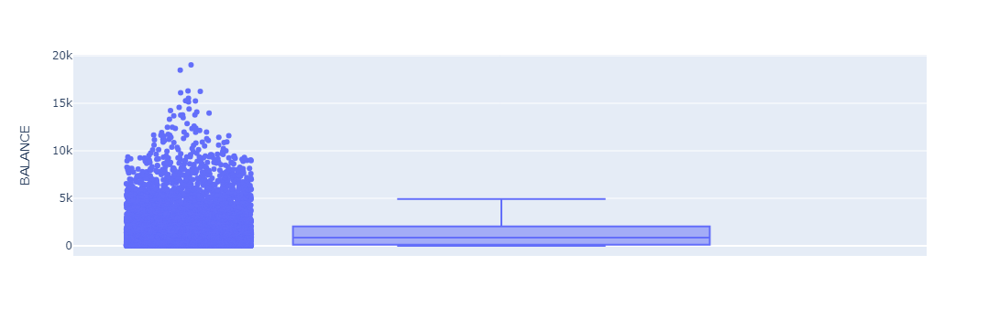

Column: BALANCE_FREQUENCY Outliers Count: 1493


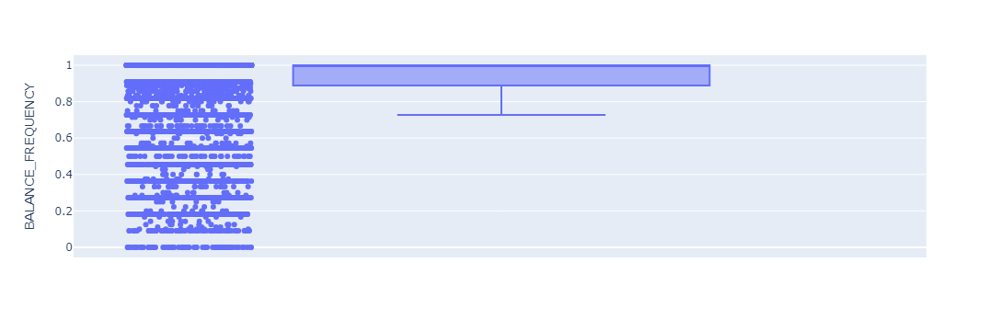

Column: PURCHASES Outliers Count: 808


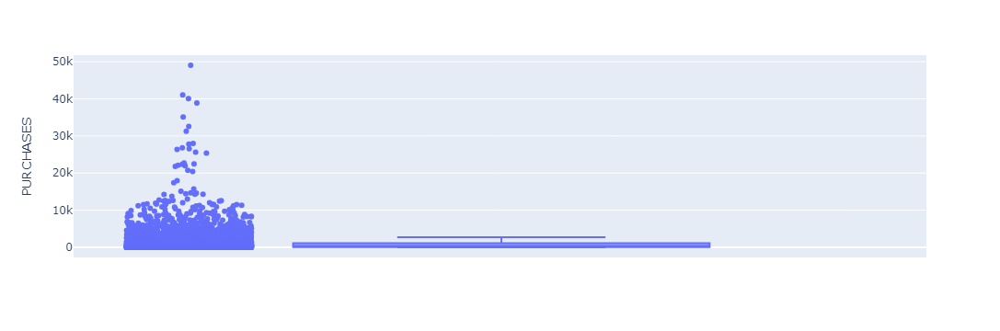

Column: ONEOFF_PURCHASES Outliers Count: 1013


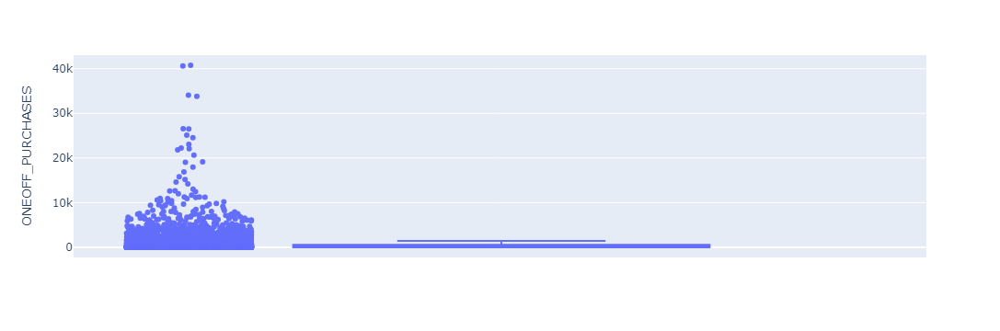

Column: INSTALLMENTS_PURCHASES Outliers Count: 867


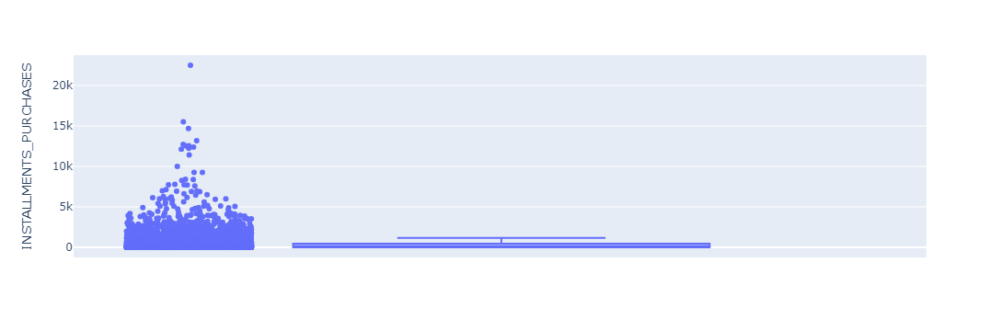

Column: CASH_ADVANCE Outliers Count: 1030


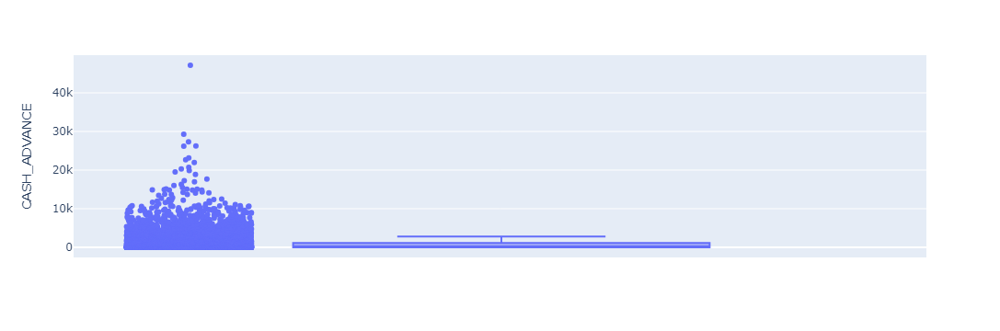

Column: PURCHASES_FREQUENCY Outliers Count: 0


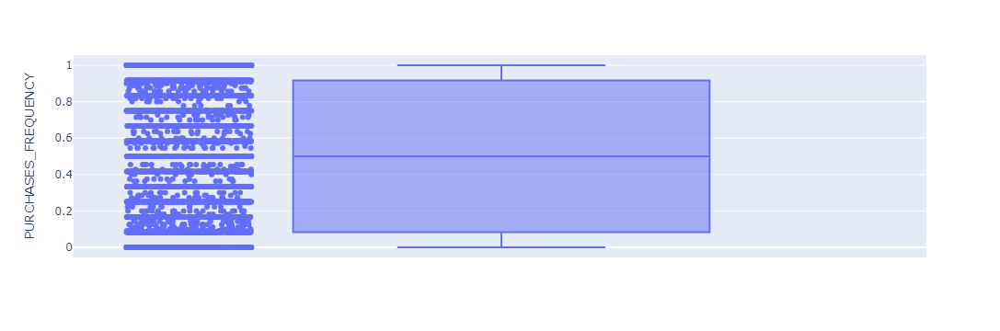

Column: ONEOFF_PURCHASES_FREQUENCY Outliers Count: 782


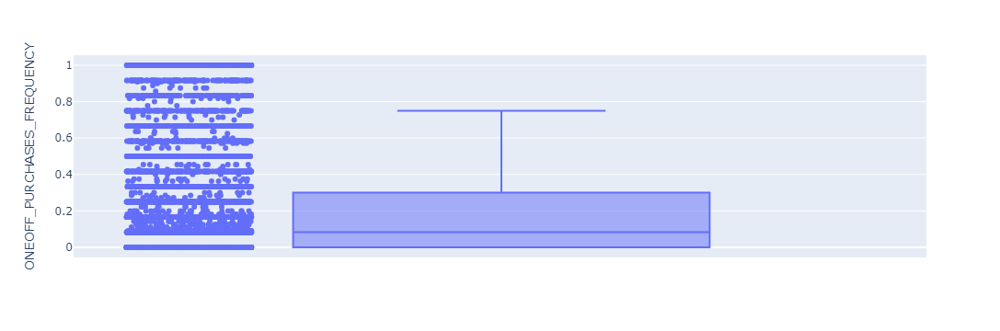

Column: PURCHASES_INSTALLMENTS_FREQUENCY Outliers Count: 0


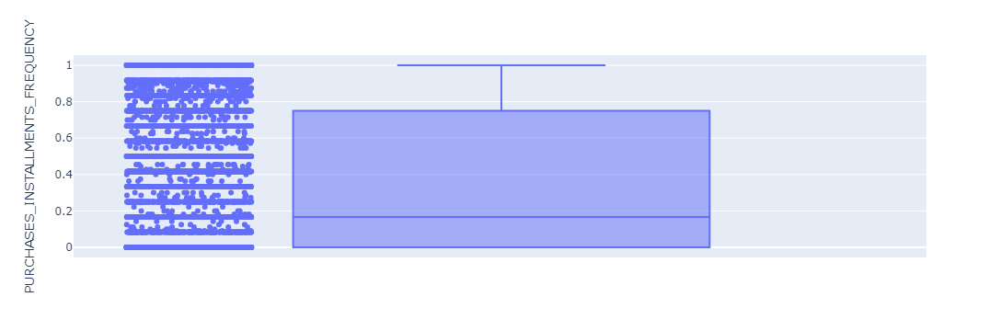

Column: CASH_ADVANCE_FREQUENCY Outliers Count: 525


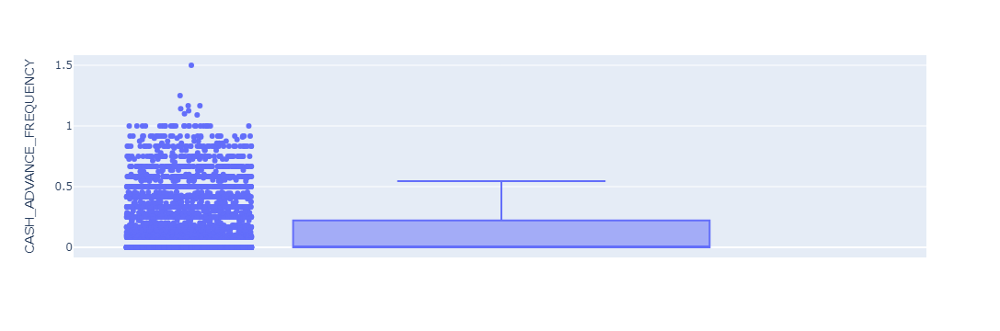

Column: CASH_ADVANCE_TRX Outliers Count: 804


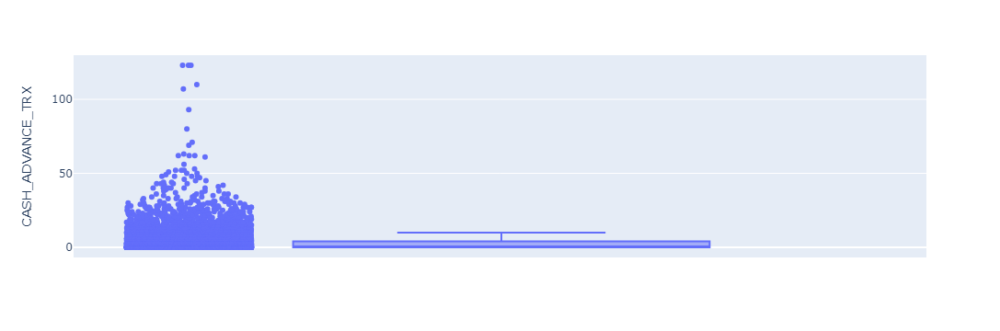

Column: PURCHASES_TRX Outliers Count: 766


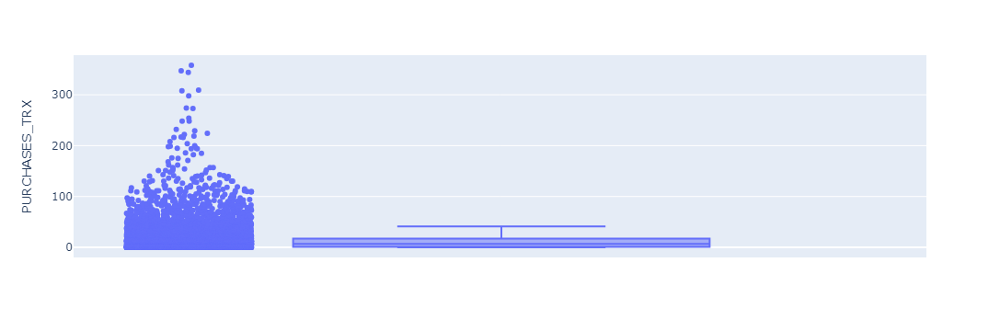

Column: CREDIT_LIMIT Outliers Count: 248


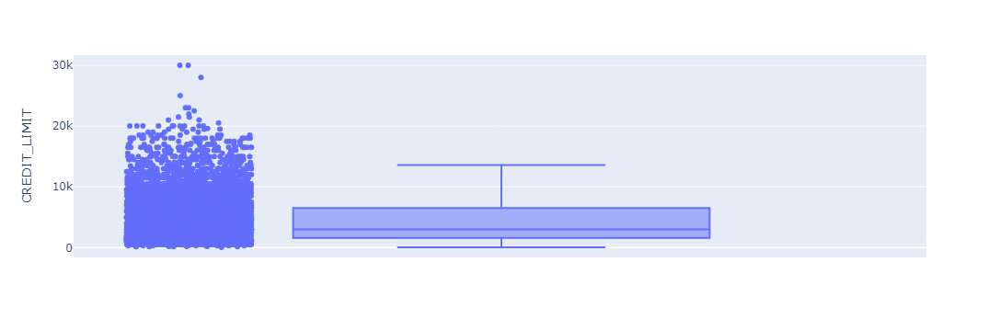

Column: PAYMENTS Outliers Count: 808


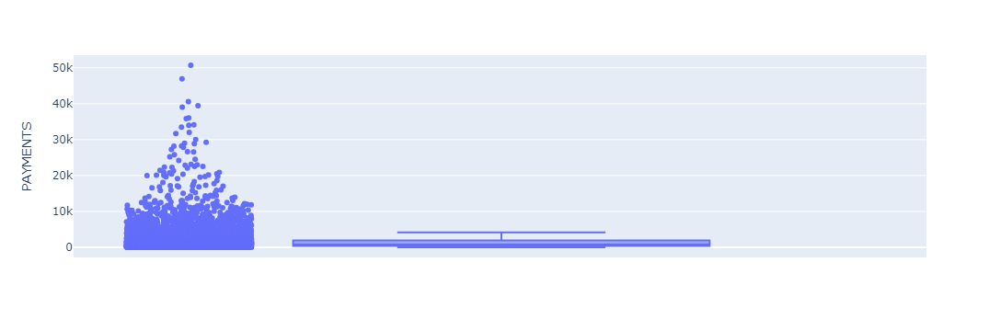

Column: MINIMUM_PAYMENTS Outliers Count: 841


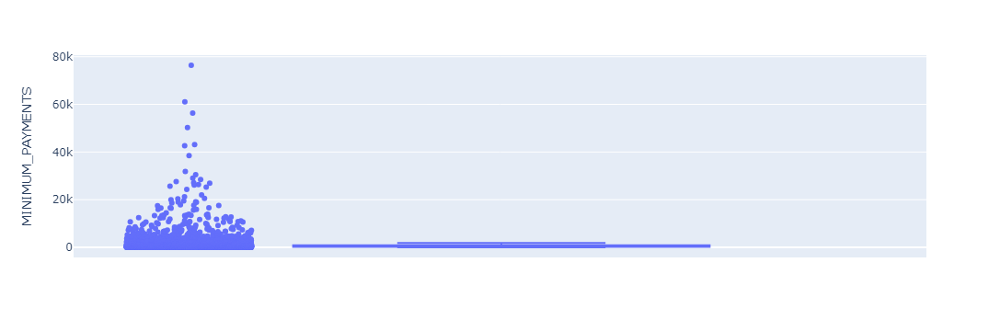

Column: PRC_FULL_PAYMENT Outliers Count: 1474


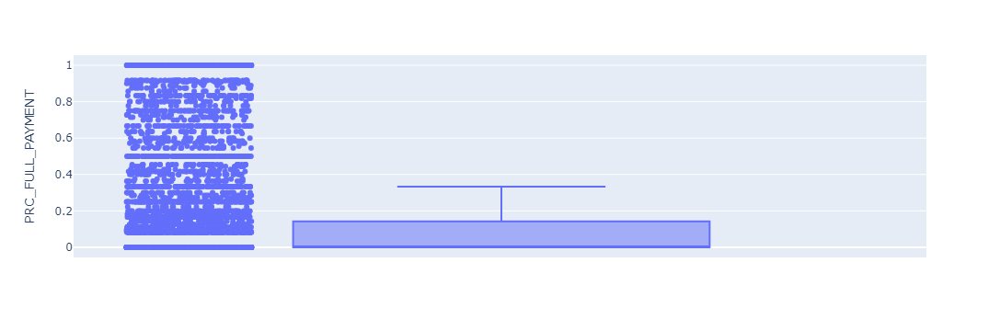

Column: TENURE Outliers Count: 1366


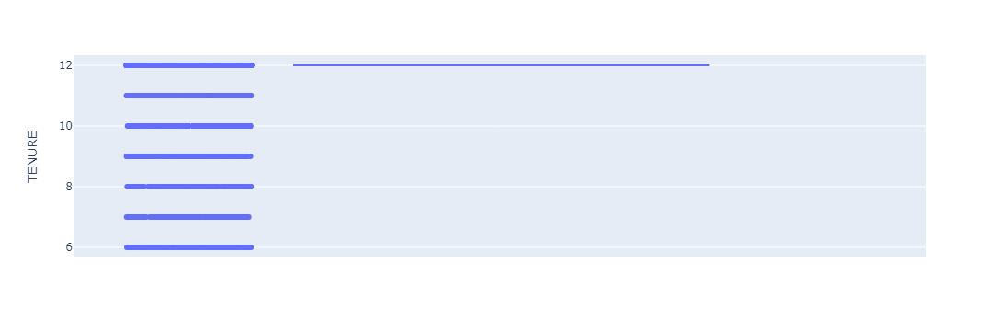

In [16]:
for i in df.columns:
    Q1 = df[i].quantile(0.25)
    Q3 = df[i].quantile(0.75)
    IQR = Q3 - Q1          
    outliers = df[(df[i] < (Q1 - 1.5 * IQR)) | (df[i] > (Q3 + 1.5 * IQR))]
    print('Column:', i, 'Outliers Count:', outliers[i].count())
    fig = px.box(df, y=i, points="all")
    fig.show()


In [17]:
corr_df = df.apply(lambda x: x.factorize()[0]).corr(method='pearson')
corr_df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.111933,0.572472,0.266531,0.442601,0.414986,0.066778,-0.028459,0.100449,0.041096,-0.005542,-0.084916,-0.037505,0.945377,0.947055,0.080152,0.168005
BALANCE_FREQUENCY,0.111933,1.000000,0.022408,-0.030513,-0.026541,0.034648,0.228285,0.082994,0.110087,0.120928,-0.045320,-0.146857,-0.030708,0.065889,0.038411,-0.037595,0.495801
PURCHASES,0.572472,0.022408,1.000000,0.546626,0.743613,-0.135828,0.265415,0.186114,0.280962,-0.192392,-0.202994,0.208954,-0.005139,0.569696,0.555852,0.151833,0.023778
ONEOFF_PURCHASES,0.266531,-0.030513,0.546626,1.000000,0.158235,0.005854,0.182246,0.483200,0.023331,-0.068823,-0.049087,0.285944,0.069025,0.255643,0.261193,0.004927,-0.023628
INSTALLMENTS_PURCHASES,0.442601,-0.026541,0.743613,0.158235,1.000000,-0.166319,0.183744,0.004151,0.413661,-0.188924,-0.190137,0.278256,-0.032254,0.452781,0.440937,0.189606,-0.005246
CASH_ADVANCE,0.414986,0.034648,-0.135828,0.005854,-0.166319,1.000000,-0.105908,-0.061702,-0.127370,0.444327,0.447982,-0.197053,-0.009069,0.391013,0.396895,-0.154607,0.153653
PURCHASES_FREQUENCY,0.066778,0.228285,0.265415,0.182246,0.183744,-0.105908,1.000000,0.525688,0.486858,0.075411,-0.065396,0.046218,-0.011126,0.062348,0.061880,0.083748,0.351551
ONEOFF_PURCHASES_FREQUENCY,-0.028459,0.082994,0.186114,0.483200,0.004151,-0.061702,0.525688,1.000000,0.185956,0.111961,0.002822,0.231405,0.046606,-0.033623,-0.027118,0.011410,0.241129
PURCHASES_INSTALLMENTS_FREQUENCY,0.100449,0.110087,0.280962,0.023331,0.413661,-0.127370,0.486858,0.185956,1.000000,0.002641,-0.094261,0.113142,-0.044586,0.102954,0.102481,0.133770,0.326169
CASH_ADVANCE_FREQUENCY,0.041096,0.120928,-0.192392,-0.068823,-0.188924,0.444327,0.075411,0.111961,0.002641,1.000000,0.520496,-0.146266,-0.004354,0.036131,0.041909,-0.098680,0.390205


<Axes: >

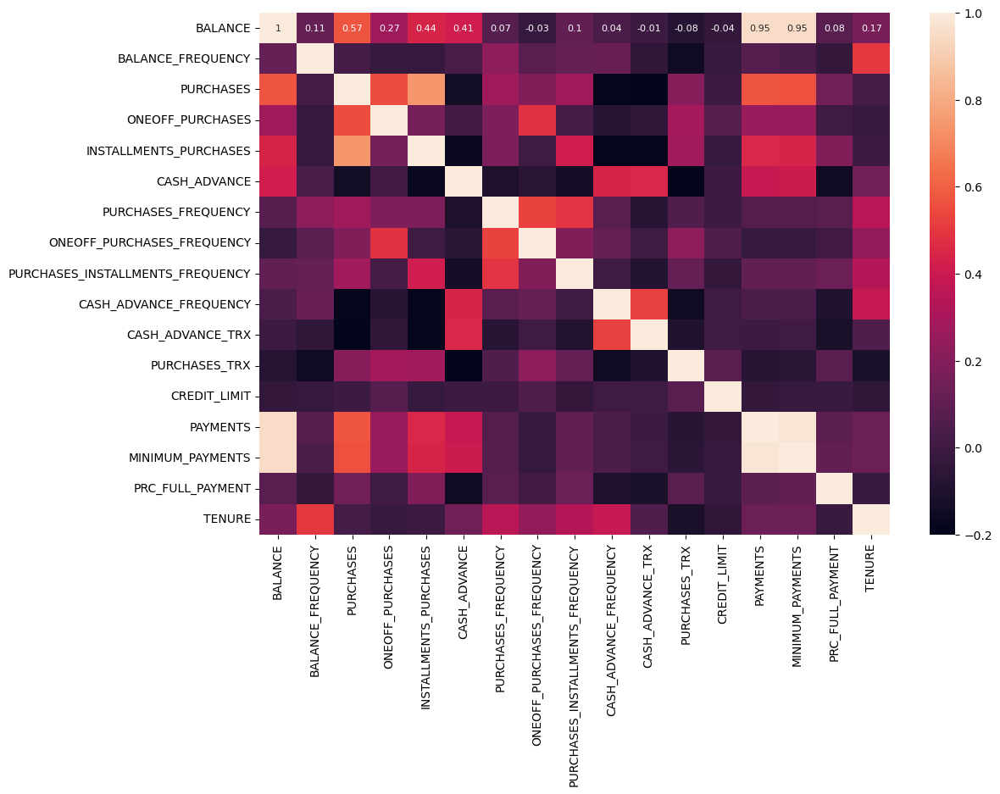

In [18]:
# plot the corrlation between rhe columns
plt.figure(figsize=(12,8))
sns.heatmap(corr_df.round(2), annot=True, annot_kws={"size": 8})

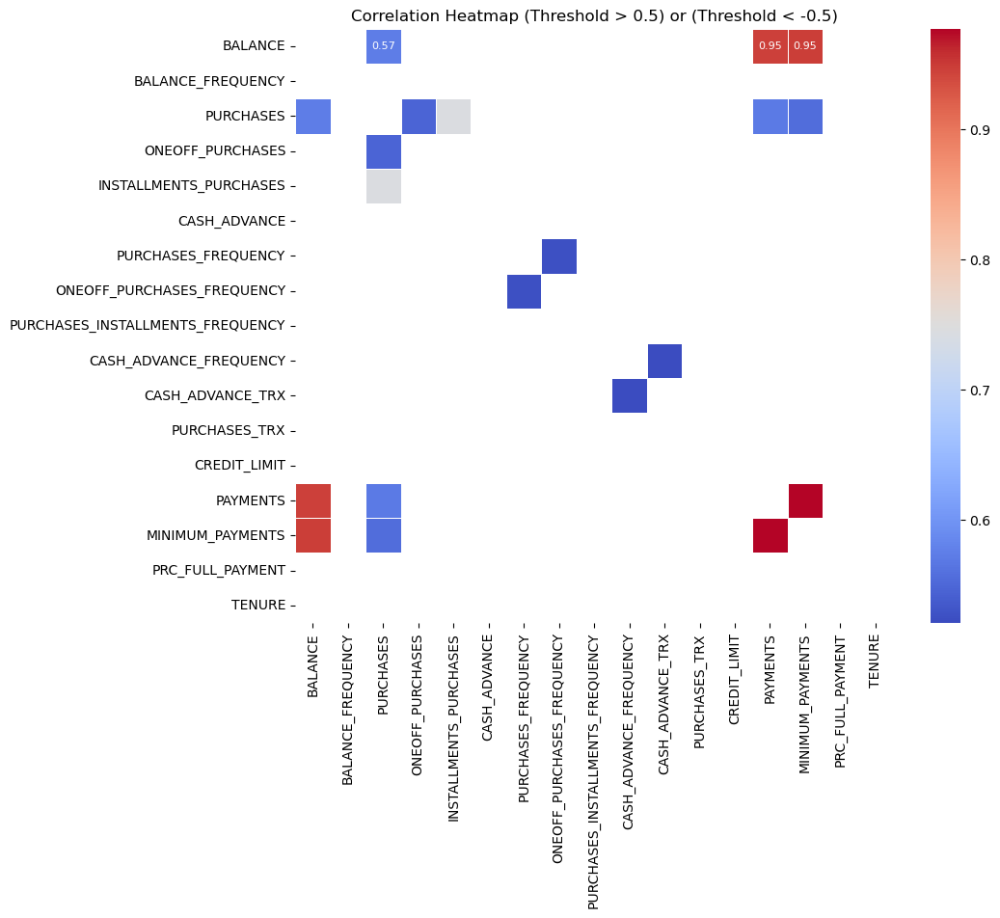

In [19]:
corr_df = df.apply(lambda x: x.factorize()[0]).corr(method='pearson')
corr_filtered = corr_df[((corr_df > 0.5) & (corr_df < 1)) | (corr_df < -0.5)]
plt.figure(figsize=(10, 8))
sns.heatmap(corr_filtered, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5,annot_kws={"size": 8})
plt.title('Correlation Heatmap (Threshold > 0.5) or (Threshold < -0.5)')
plt.show()

<Axes: >

<Figure size 1200x800 with 0 Axes>

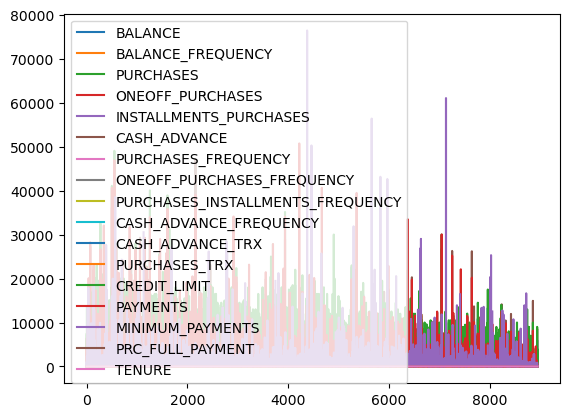

In [20]:
plt.figure(figsize=(12,8))
df.plot()

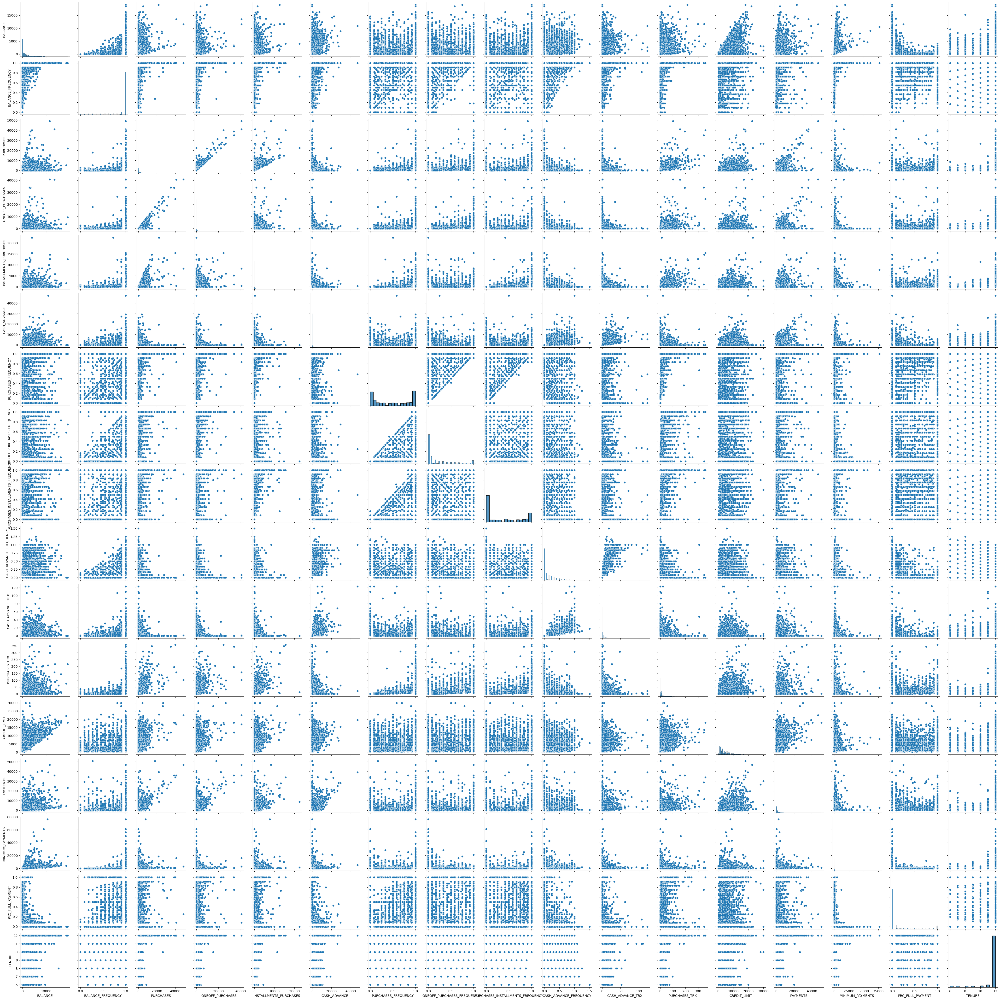

In [21]:
sns.pairplot(df)


## 3. <a name="3">Data preprocessing and Features transformation</a>
(<a href="#0">Go to top</a>)


In [22]:
df = df.dropna()

In [23]:
df_copy=df.copy()

In [24]:
df_copy = df_copy.dropna()

In [99]:
def PlotTSNE(df, perplexity=40, n_iter=300, hue=None):
    
    tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity, n_iter=n_iter)
    tsne_results = tsne.fit_transform(df)

    tsne_2d_one = tsne_results[:,0]
    tsne_2d_two = tsne_results[:,1]

    sns.scatterplot(
        x=tsne_2d_one, y=tsne_2d_two,
        legend="full",
        hue=hue,
        palette='tab10'
    )
    plt.title("TSNE")
    
    return tsne_results , tsne_2d_one ,tsne_2d_two

In [26]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8636 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8636 non-null   float64
 1   BALANCE_FREQUENCY                 8636 non-null   float64
 2   PURCHASES                         8636 non-null   float64
 3   ONEOFF_PURCHASES                  8636 non-null   float64
 4   INSTALLMENTS_PURCHASES            8636 non-null   float64
 5   CASH_ADVANCE                      8636 non-null   float64
 6   PURCHASES_FREQUENCY               8636 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 10  CASH_ADVANCE_TRX                  8636 non-null   int64  
 11  PURCHASES_TRX                     8636 non-null   int64  
 12  CREDIT_LIMI

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.002s...
[t-SNE] Computed neighbors for 8636 samples in 0.747s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 265.478475
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.376770
[t-SNE] KL divergence after 300 iterations: 2.346070


(array([[-11.215922  ,   1.4394876 ],
        [  4.2045345 ,  -5.1361413 ],
        [  5.325225  ,   0.06896073],
        ...,
        [-11.348777  ,   1.5910387 ],
        [-11.175508  ,  -1.120804  ],
        [ -5.1271596 ,   2.879661  ]], dtype=float32),
 array([-11.215922 ,   4.2045345,   5.325225 , ..., -11.348777 ,
        -11.175508 ,  -5.1271596], dtype=float32),
 array([ 1.4394876 , -5.1361413 ,  0.06896073, ...,  1.5910387 ,
        -1.120804  ,  2.879661  ], dtype=float32))

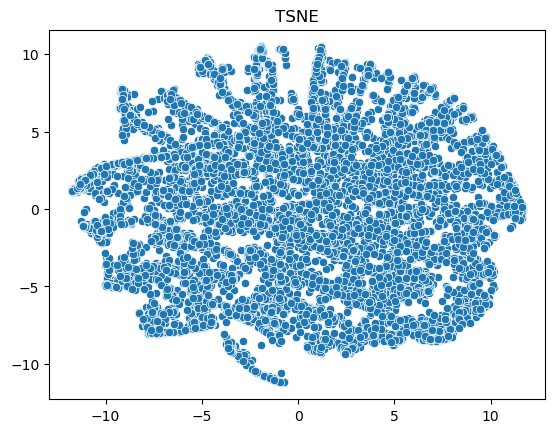

In [27]:
PlotTSNE(df_copy)

### Define below all the issues that you had found in the previous part
1-  outliers         <br>
2-   missing values        <br>
3-           <br>

In [28]:
df_copy

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


### for each issue adapt this methodology
- start by defining the solution
- apply this solution onn the data
- test the solution to make sure that you have solved the issue

**First issue**

In [29]:
low_cols = ['BALANCE_FREQUENCY', 'PURCHASES_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'PRC_FULL_PAYMENT']

medium_cols = ['CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'TENURE']
columns = df.columns
merge = low_cols + medium_cols
other_cols = list(set(columns) - set(merge))

In [30]:
#solution
transformer = RobustScaler()
robustscaler = transformer.fit_transform(df_copy[medium_cols +other_cols])
robustscaler

array([[ 0.        , -0.29411765,  0.        , ..., -0.26349814,
        -0.40816327,  0.        ],
       [ 1.        , -0.41176471,  0.        , ...,  1.15777817,
         0.81632653,  5.68971039],
       [ 0.        ,  0.29411765,  0.        , ...,  0.47968415,
         0.91836735,  0.        ],
       ...,
       [ 0.        , -0.11764706, -6.        , ..., -0.3504836 ,
        -0.40816327,  0.        ],
       [ 0.5       , -0.41176471, -6.        , ..., -0.3911074 ,
        -0.51020408,  0.03228475],
       [ 0.5       ,  0.94117647, -6.        , ..., -0.34153907,
        -0.36734694,  0.11218795]])

In [31]:
transformer = RobustScaler()
robustscaler = transformer.fit_transform(df_copy[medium_cols +other_cols])
robustscaler
robustscaler_df = pd.DataFrame(data=robustscaler, columns=transformer.get_feature_names_out())
robustscaler_df.head(3) 

,CASH_ADVANCE_TRX,PURCHASES_TRX,TENURE,PAYMENTS,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,BALANCE,PURCHASES,MINIMUM_PAYMENTS,CREDIT_LIMIT,CASH_ADVANCE
0,0.0,-0.294118,0.0,-0.453400,-0.075104,0.001270,-0.447578,-0.253947,-0.263498,-0.408163,0.00000
1,1.0,-0.411765,0.0,2.092126,-0.075104,-0.195777,1.167856,-0.340469,1.157778,0.816327,5.68971
2,0.0,0.294118,0.0,-0.179180,1.215448,-0.195777,0.806445,0.360748,0.479684,0.918367,0.00000


**Second issue**

In [32]:
df_copy = df_copy.reset_index(drop=True)
df_copy = pd.concat((robustscaler_df, df_copy[low_cols]), axis=1)
df_copy

,CASH_ADVANCE_TRX,PURCHASES_TRX,TENURE,PAYMENTS,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,BALANCE,PURCHASES,MINIMUM_PAYMENTS,CREDIT_LIMIT,CASH_ADVANCE,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PRC_FULL_PAYMENT
0,0.0,-0.294118,0.0,-0.453400,-0.075104,0.001270,-0.447578,-0.253947,-0.263498,-0.408163,0.000000,0.818182,0.166667,0.000000,0.083333,0.000000,0.000000
1,1.0,-0.411765,0.0,2.092126,-0.075104,-0.195777,1.167856,-0.340469,1.157778,0.816327,5.689710,0.909091,0.000000,0.000000,0.000000,0.250000,0.222222
2,0.0,0.294118,0.0,-0.179180,1.215448,-0.195777,0.806445,0.360748,0.479684,0.918367,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
3,0.0,-0.352941,0.0,-0.142466,-0.048398,-0.195777,-0.050657,-0.325958,-0.103090,-0.367347,0.000000,1.000000,0.083333,0.083333,0.000000,0.000000,0.000000
4,0.0,0.058824,0.0,0.328453,-0.075104,2.558094,0.456274,0.868732,3.191663,-0.244898,0.000000,1.000000,0.666667,0.000000,0.583333,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,0.0,-0.352941,-6.0,-0.546809,-0.040219,-0.195777,-0.465476,-0.321514,-0.409820,-0.510204,0.000000,0.500000,0.166667,0.166667,0.000000,0.000000,0.000000
8632,0.0,-0.058824,-6.0,-0.372627,-0.075104,0.405527,-0.453917,-0.076441,-0.401574,-0.408163,0.000000,1.000000,1.000000,0.000000,0.833333,0.000000,0.500000
8633,0.0,-0.117647,-6.0,-0.532046,-0.075104,0.102479,-0.456521,-0.209507,-0.350484,-0.408163,0.000000,0.833333,0.833333,0.000000,0.666667,0.000000,0.250000
8634,0.5,-0.411765,-6.0,-0.550786,-0.075104,-0.195777,-0.461600,-0.340469,-0.391107,-0.510204,0.032285,0.833333,0.000000,0.000000,0.000000,0.166667,0.250000


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.001s...
[t-SNE] Computed neighbors for 8636 samples in 0.439s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.433627
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.275299
[t-SNE] KL divergence after 300 iterations: 2.514169


(array([[-6.8147817, -4.179727 ],
        [ 2.2713294,  7.062502 ],
        [ 1.0875432, -0.6384224],
        ...,
        [-7.2353773,  9.187482 ],
        [-5.817466 ,  9.374358 ],
        [-6.316276 ,  8.070653 ]], dtype=float32),
 array([-6.8147817,  2.2713294,  1.0875432, ..., -7.2353773, -5.817466 ,
        -6.316276 ], dtype=float32),
 array([-4.179727 ,  7.062502 , -0.6384224, ...,  9.187482 ,  9.374358 ,
         8.070653 ], dtype=float32))

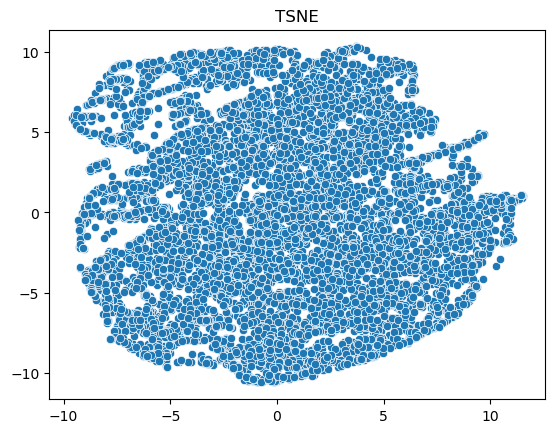

In [33]:
PlotTSNE(df_copy)

In [34]:
#test


In [35]:
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


*What is the feature scaling technique that would use and why?* <br>
*return to this section again and try another technique and see how that will impact your result*<br>
for more details on different methods for scaling check these links
- https://scikit-learn.org/stable/modules/preprocessing.html#preprocessing
- https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing
- https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

Answer here:

In [36]:
#from sklearn import preprocessing

## 5. <a name="5">K Means</a>
(<a href="#5">Go to top</a>)

1- Use the k means class that you implemented in the previous task to cluster this data
2- Use http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html and see if the difference in the result
3- Use elbow method to determine the K (plot the result using two plot one for distorion and another for inertia)
4- (Optionally) make a method that pick the best number of clusters for you
5- Using different techniques for scaling and comment on the result

In [37]:
class K_means:
    def __init__(self, K):
        self.K = K
        self.centroids = None

    def findClosestCentroids(self, X):
        m, _ = X.shape
        closest_centroids = np.zeros(m, dtype=int)

        for i in range(m):
            distances = np.linalg.norm(X[i] - self.centroids, axis=1)
            closest_centroids[i] = np.argmin(distances)

        return closest_centroids

    def computeCentroids(self, X, idx):
        m, n = X.shape
        centroids = np.zeros((self.K, n))

        for i in range(self.K):
            cluster_points = X[idx == i]
            if len(cluster_points) > 0:
                centroids[i] = np.mean(cluster_points, axis=0)

        return centroids

    def kMeansInitCentroids(self, X):
        m, _ = X.shape
        idx = np.random.choice(m, self.K, replace=False)
        centroids = X[idx]

        return centroids

    def KMeans_alg(self, X, initial_centroids=None):
        if initial_centroids is None:
            self.centroids = self.kMeansInitCentroids(X)
        else:
            self.centroids = initial_centroids
        
        idx = self.findClosestCentroids(X)
        self.centroids = self.computeCentroids(X, idx)

        return self.centroids, idx

    def fit_predict(self, X):
        return self.findClosestCentroids(X)

## Elbow Method

### elbow method in k means

In [38]:
wss = []
K = range(2, 21)

for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans = kmeans.fit(df_copy)
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

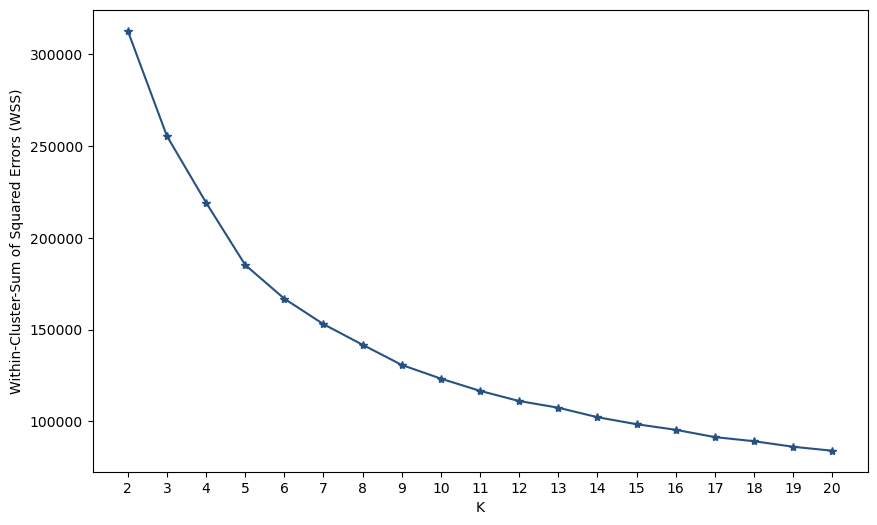

In [39]:
plt.figure(figsize=(10, 6))
plt.plot(K, wss, marker='*', c='#' + str(np.random.randint(100000, 999999)))
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(range(int(min(K)), int(max(K)) + 1))
plt.show()

## 6. <a name="5">Training and hyperparamter tuning</a>
(<a href="#0">Go to top</a>)


Before we start the training process we need to specify 3 paramters:<br>
1- Linkage criteria : The linkage criterion determines the distance between two clusters
    - Complete-Linkage Clustering
    - Single-Linkage Clustering
    - Average-Linkage Clustering
    - Centroid Linkage Clustering
2- Distance function:
    - Euclidean Distance
    - Manhattan Distance
    - Mahalanobis distance
3- Number of clusters


### *Number of clusters*
Use Dendograms to specify the optimum number of clusters
- Compare how changing linkage criteria or distance function would affect the optimum number of clusters
- you can use silhouette_score or any other evalution method to help you determine the optimum number of clusters
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

In [40]:
li = []
K = range(2,21)
for i in range(2,21):
  kmeans = KMeans(n_clusters = i).fit(df_copy)
  labels = kmeans.labels_
  li.append(metrics.silhouette_score(df_copy, labels, metric = 'euclidean'))

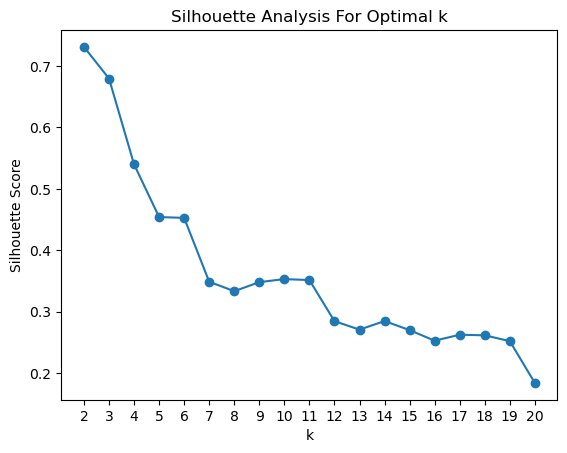

In [41]:
plt.plot(K, li, 'o-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis For Optimal k')
plt.xticks(K)
plt.show()

In [42]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(df_copy)

Clusters = kmeans.labels_
Clusters

array([0, 4, 0, ..., 0, 0, 0])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.001s...
[t-SNE] Computed neighbors for 8636 samples in 0.455s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.433627
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.275299
[t-SNE] KL divergence after 300 iterations: 2.514190


(array([[-6.815606  , -4.178062  ],
        [ 2.274096  ,  7.061366  ],
        [ 1.0870091 , -0.64069533],
        ...,
        [-7.2321496 ,  9.188664  ],
        [-5.8145604 ,  9.37494   ],
        [-6.3135605 ,  8.071273  ]], dtype=float32),
 array([-6.815606 ,  2.274096 ,  1.0870091, ..., -7.2321496, -5.8145604,
        -6.3135605], dtype=float32),
 array([-4.178062  ,  7.061366  , -0.64069533, ...,  9.188664  ,
         9.37494   ,  8.071273  ], dtype=float32))

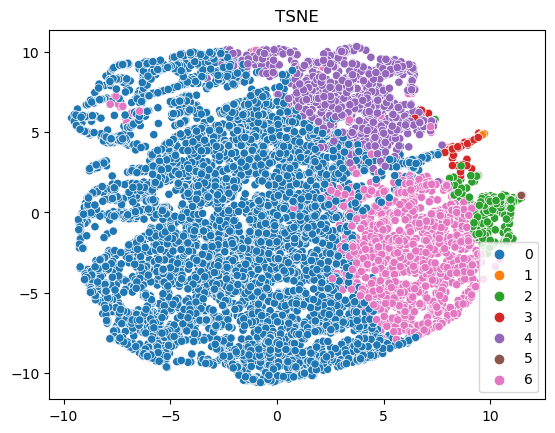

In [43]:
PlotTSNE(df_copy, hue=Clusters)

## 6. <a name="6">improvement ideas</a>
(<a href="#0">Go to top</a>)

## 7. <a name="7">PCA</a>


### PCA

In [44]:
pca = PCA(n_components=.95)
pca_result = pca.fit_transform(df_copy)

print('Explained variation summation for all components: {}'.format(sum(pca.explained_variance_ratio_)))
pca_result

Explained variation summation for all components: 0.9531047297911619


array([[-2.41604693, -0.19844271, -1.13187991, ...,  0.50557515,
        -0.04993713,  0.4305644 ],
       [-0.2632524 ,  1.63820491,  4.29730535, ...,  1.26617888,
        -1.75002199, -1.46215067],
       [-0.59619613, -0.31377298, -1.01336438, ...,  0.55555428,
         0.34324945, -0.82297018],
       ...,
       [-2.59865577, -0.32360855, -0.98861554, ..., -4.91735834,
        -2.31162904, -0.01566945],
       [-2.85846093, -0.14936191, -0.54940114, ..., -4.96114858,
        -2.10672052,  0.37526204],
       [-1.01664564, -1.29867185, -0.73931557, ..., -5.2853234 ,
        -1.39580963, -0.45346784]])

In [45]:
pca_result

array([[-2.41604693, -0.19844271, -1.13187991, ...,  0.50557515,
        -0.04993713,  0.4305644 ],
       [-0.2632524 ,  1.63820491,  4.29730535, ...,  1.26617888,
        -1.75002199, -1.46215067],
       [-0.59619613, -0.31377298, -1.01336438, ...,  0.55555428,
         0.34324945, -0.82297018],
       ...,
       [-2.59865577, -0.32360855, -0.98861554, ..., -4.91735834,
        -2.31162904, -0.01566945],
       [-2.85846093, -0.14936191, -0.54940114, ..., -4.96114858,
        -2.10672052,  0.37526204],
       [-1.01664564, -1.29867185, -0.73931557, ..., -5.2853234 ,
        -1.39580963, -0.45346784]])

In [46]:
pca_result.shape

(8636, 7)

In [47]:
wss = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(pca_result)
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

In [48]:
K = range(2,21)

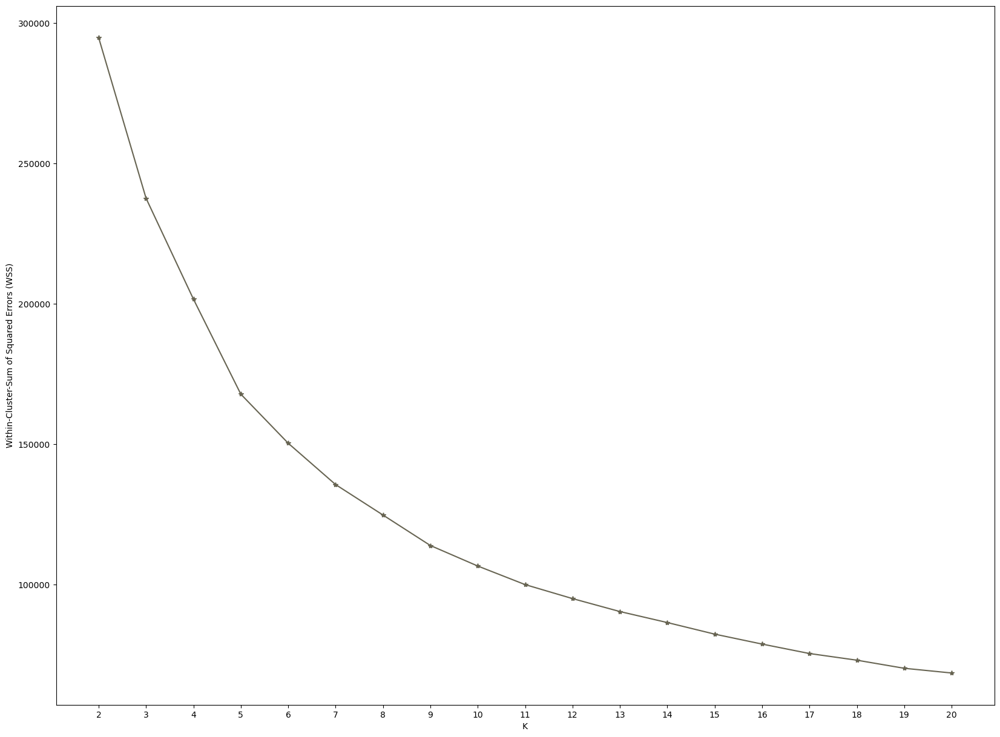

In [49]:
def pick_random_color():
  return '#'+str(np.random.randint(100000, 999999))
plt.figure(figsize=(20,15))
plt.plot(K,wss, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [50]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

array([0, 5, 0, ..., 0, 0, 0])

In [51]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.034s...
[t-SNE] Computed neighbors for 8636 samples in 0.616s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.247926
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.971298
[t-SNE] KL divergence after 300 iterations: 2.359174


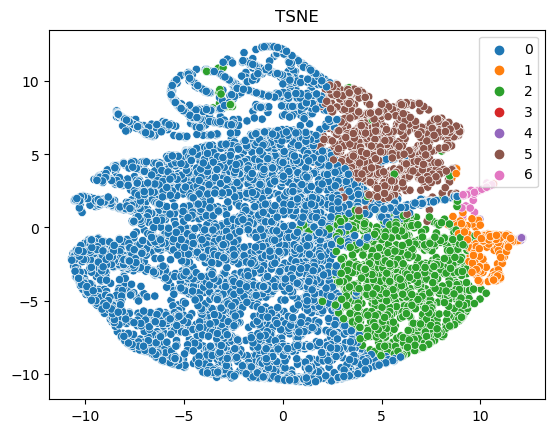

In [52]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");

8. <a href="#8">LOG Transformation</a>

### LOG Transformation

In [53]:
copy_df = df.copy()
copy_df = copy_df.dropna().reset_index(drop=True)
copy_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12


In [54]:
def change_zero(value):
    if value == 0:
        return np.log(0.001)
    return np.log(value)

# Example usage
for col in copy_df[other_cols + medium_cols]:
    copy_df[col] = copy_df[col].apply(change_zero)

print(copy_df)

       BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
0     3.711148           0.818182   4.558079         -6.907755   
1     8.071677           0.909091  -6.907755         -6.907755   
2     7.822104           1.000000   6.650499          6.650499   
3     6.706513           1.000000   2.772589          2.772589   
4     7.500988           1.000000   7.195397         -6.907755   
...        ...                ...        ...               ...   
8631  1.770146           0.500000   3.039749          3.039749   
8632  3.349677           1.000000   5.673736         -6.907755   
8633  3.152679           0.833333   4.972587         -6.907755   
8634  2.599541           0.833333  -6.907755         -6.907755   
8635  5.920795           0.666667   6.996910          6.996910   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
0                   4.558079     -6.907755             0.166667   
1                  -6.907755      8.770741             0.000000   
2     

In [55]:
copy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8636 entries, 0 to 8635
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8636 non-null   float64
 1   BALANCE_FREQUENCY                 8636 non-null   float64
 2   PURCHASES                         8636 non-null   float64
 3   ONEOFF_PURCHASES                  8636 non-null   float64
 4   INSTALLMENTS_PURCHASES            8636 non-null   float64
 5   CASH_ADVANCE                      8636 non-null   float64
 6   PURCHASES_FREQUENCY               8636 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 10  CASH_ADVANCE_TRX                  8636 non-null   float64
 11  PURCHASES_TRX                     8636 non-null   float64
 12  CREDIT

#### using pca after log

In [56]:
pca = PCA(n_components=.95)
pca_result = pca.fit_transform(copy_df)

print('Explained variation summation for all components: {}'.format(sum(pca.explained_variance_ratio_)))
pca_result

Explained variation summation for all components: 0.9707037085904731


array([[ -5.05328352, -10.35934649,   1.24669081,  -1.35252254],
       [ 18.76139883,  -1.42242837,  -0.12810836,   1.86662878],
       [ -6.07737643,   3.01806367, -10.94825849,  -1.85275876],
       ...,
       [ -5.81068933, -10.37836969,   1.6855124 ,  -2.00722352],
       [ 15.5453657 ,  -5.45752819,  -3.36886489,   0.70637616],
       [  1.68264588,  10.68698582,  -3.90418221,  -5.36033776]])

In [57]:
pca_result.shape

(8636, 4)

In [58]:
wss = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(pca_result)
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

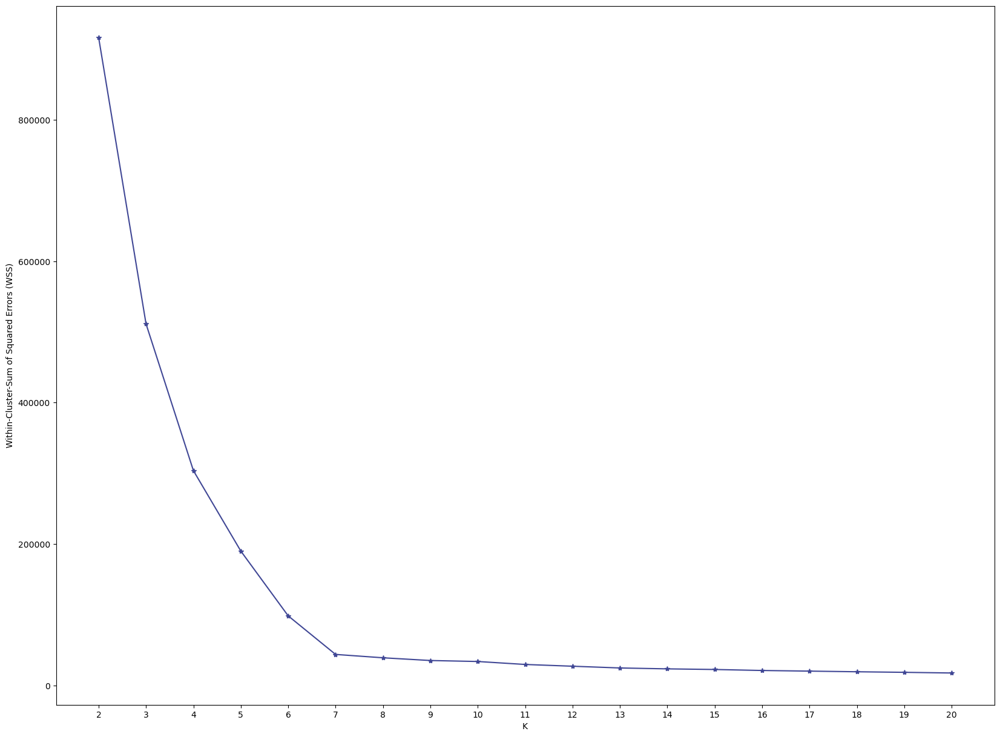

In [59]:
def pick_random_color():
  return '#'+str(np.random.randint(100000, 999999))
plt.figure(figsize=(20,15))
plt.plot(K,wss, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [60]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

array([0, 1, 4, ..., 0, 1, 5])

In [61]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.024s...
[t-SNE] Computed neighbors for 8636 samples in 0.274s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.209364
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.886761
[t-SNE] KL divergence after 300 iterations: 1.956650


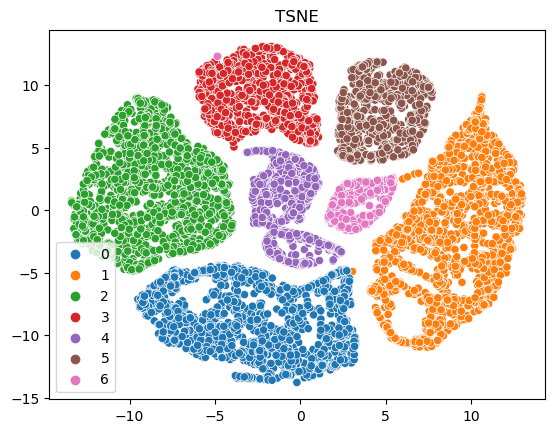

In [62]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");

In [63]:
from scipy.stats import skew

def show_distribution(dataframe, columns_list):
    fig, ax = plt.subplots(len(columns_list), 2, figsize=(15, 5 * len(columns_list)))
    
    for i, col in enumerate(columns_list):
        color = pick_random_color()  # Assuming pick_random_color() is defined elsewhere
        skewness_value = skew(dataframe[col], bias=True)
        
        # Boxplot
        sns.boxplot(data=dataframe, x=col, ax=ax[i, 0], color=color)
        ax[i, 0].set_title(f'{col.title()} Boxplot\nSkewness : {skewness_value}', fontsize=12)
        
        # Histogram
        sns.histplot(data=dataframe, x=col, ax=ax[i, 1], color=color)
        ax[i, 1].set_title(f'{col.title()} Histogram', fontsize=12)

    plt.tight_layout()
    plt.show()

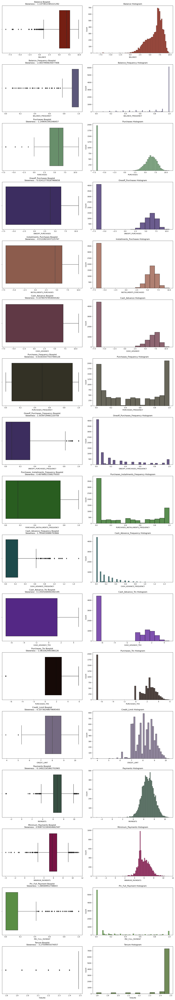

In [64]:
show_distribution(copy_df, copy_df.columns)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.001s...
[t-SNE] Computed neighbors for 8636 samples in 0.603s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.749932
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.855667
[t-SNE] KL divergence after 300 iterations: 2.240476


(array([[ -1.6120921 , -10.938522  ],
        [  3.9393902 ,   1.3541973 ],
        [  0.670146  ,   4.183326  ],
        ...,
        [  0.23605831, -10.731442  ],
        [  6.2402563 ,  -7.8181367 ],
        [  6.9796386 ,   7.8340645 ]], dtype=float32),
 array([-1.6120921 ,  3.9393902 ,  0.670146  , ...,  0.23605831,
         6.2402563 ,  6.9796386 ], dtype=float32),
 array([-10.938522 ,   1.3541973,   4.183326 , ..., -10.731442 ,
         -7.8181367,   7.8340645], dtype=float32))

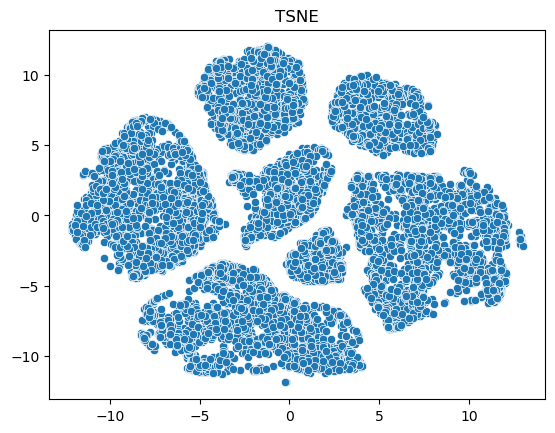

In [65]:
PlotTSNE(copy_df)

In [66]:
sil = []
K = range(2,21)
for k in K:
  kmeans = KMeans(n_clusters = k).fit(copy_df)
  labels = kmeans.labels_
  sil.append(metrics.silhouette_score(copy_df, labels, metric = 'euclidean'))

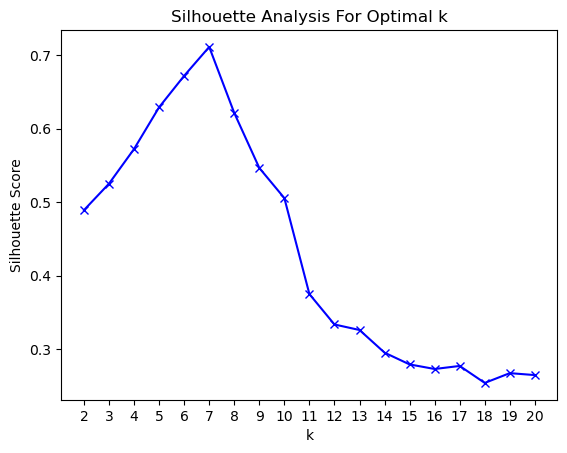

In [67]:
plt.plot(K, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis For Optimal k')
plt.xticks(K)
plt.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.001s...
[t-SNE] Computed neighbors for 8636 samples in 0.555s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.749932
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.855667
[t-SNE] KL divergence after 300 iterations: 2.240476


(array([[ -1.6120921 , -10.938522  ],
        [  3.9393902 ,   1.3541973 ],
        [  0.670146  ,   4.183326  ],
        ...,
        [  0.23605831, -10.731442  ],
        [  6.2402563 ,  -7.8181367 ],
        [  6.9796386 ,   7.8340645 ]], dtype=float32),
 array([-1.6120921 ,  3.9393902 ,  0.670146  , ...,  0.23605831,
         6.2402563 ,  6.9796386 ], dtype=float32),
 array([-10.938522 ,   1.3541973,   4.183326 , ..., -10.731442 ,
         -7.8181367,   7.8340645], dtype=float32))

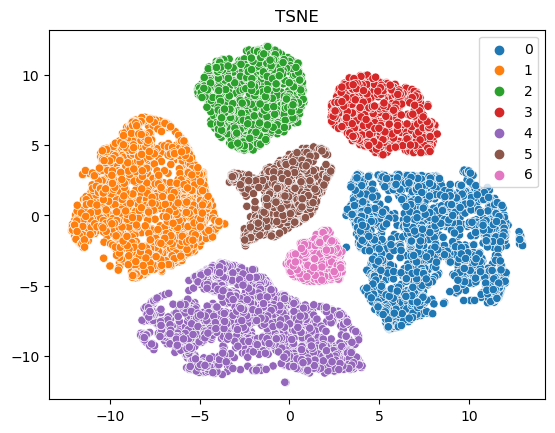

In [68]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(copy_df)

Clusters = kmeans.labels_

PlotTSNE(copy_df, hue=Clusters)

- Try to use PCA to reduce the number of features and compare how this will affect the clustring process
- Try to run your code again but with different tranformation technique
- Implement gap statistics method and use it as evaluation metric and compare the result with what you did before https://www.datanovia.com/en/lessons/determining-the-optimal-number-of-clusters-3-must-know-methods/#gap-statistic-method

9. <a href="#9">Hierarchical Clustering</a>

### Hierarchical Clustering

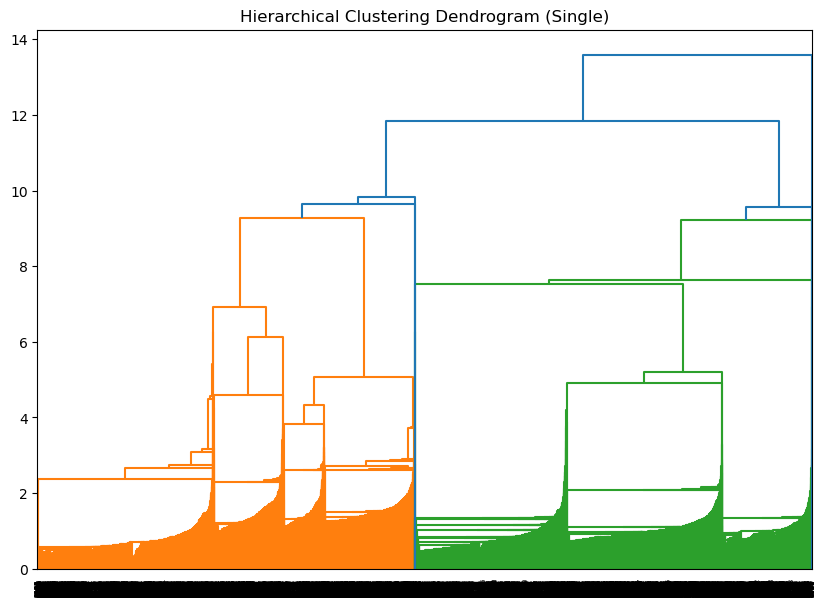

In [69]:
from scipy.cluster.hierarchy import dendrogram, linkage

linked = linkage(copy_df, 'single')

plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram (Single)')
plt.show()

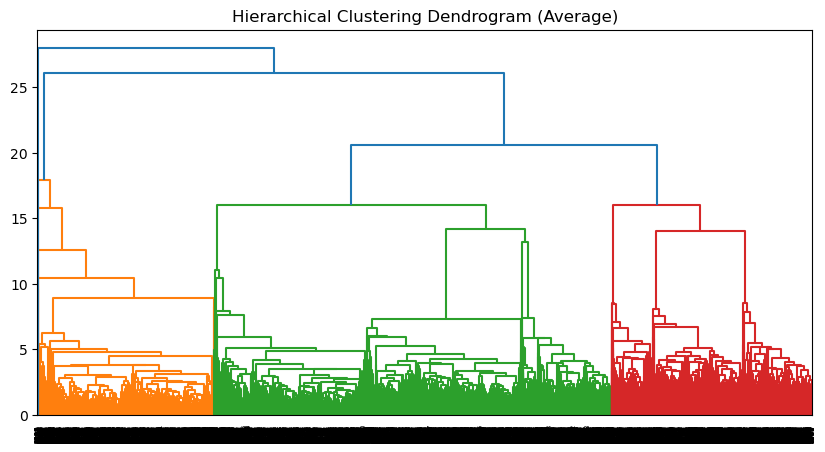

In [70]:
Z = linkage(copy_df, 'average')

plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram (Average)')
plt.show()

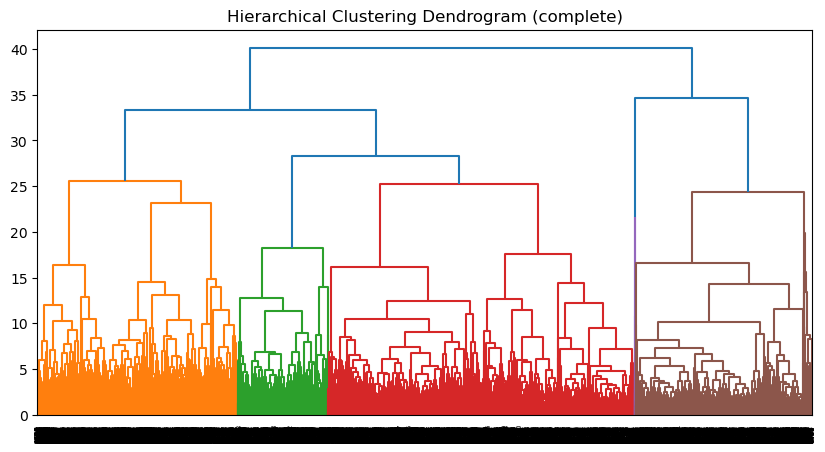

In [71]:
Z = linkage(copy_df, 'complete')

plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram (complete)')
plt.show()

In [72]:
from sklearn.cluster import AgglomerativeClustering

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.001s...
[t-SNE] Computed neighbors for 8636 samples in 0.379s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.749932
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.884079
[t-SNE] KL divergence after 300 iterations: 2.240254


(array([[ -0.74263746, -10.950578  ],
        [  4.211509  ,   1.5527726 ],
        [ -0.4283604 ,   3.256629  ],
        ...,
        [  0.7266791 , -10.547865  ],
        [  6.074916  ,  -7.6766644 ],
        [  6.7579193 ,   8.339594  ]], dtype=float32),
 array([-0.74263746,  4.211509  , -0.4283604 , ...,  0.7266791 ,
         6.074916  ,  6.7579193 ], dtype=float32),
 array([-10.950578 ,   1.5527726,   3.256629 , ..., -10.547865 ,
         -7.6766644,   8.339594 ], dtype=float32))

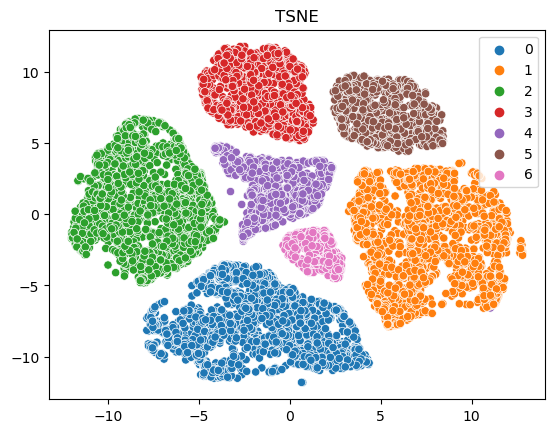

In [73]:
clustering = AgglomerativeClustering(n_clusters=7).fit(copy_df)

Clusters = clustering.labels_
copy_df['cluster'] = clustering.labels_

PlotTSNE(copy_df, hue=Clusters)

10. <a href="#10">DBSCAN</a>

### DBSCAN

In [74]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=5, min_samples=500)
labels = dbscan.fit_predict(copy_df)
labels

array([0, 1, 2, ..., 0, 1, 5], dtype=int64)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.001s...
[t-SNE] Computed neighbors for 8636 samples in 0.402s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.749932
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.884079
[t-SNE] KL divergence after 300 iterations: 2.240254


(array([[ -0.74263746, -10.950578  ],
        [  4.211509  ,   1.5527726 ],
        [ -0.4283604 ,   3.256629  ],
        ...,
        [  0.7266791 , -10.547865  ],
        [  6.074916  ,  -7.6766644 ],
        [  6.7579193 ,   8.339594  ]], dtype=float32),
 array([-0.74263746,  4.211509  , -0.4283604 , ...,  0.7266791 ,
         6.074916  ,  6.7579193 ], dtype=float32),
 array([-10.950578 ,   1.5527726,   3.256629 , ..., -10.547865 ,
         -7.6766644,   8.339594 ], dtype=float32))

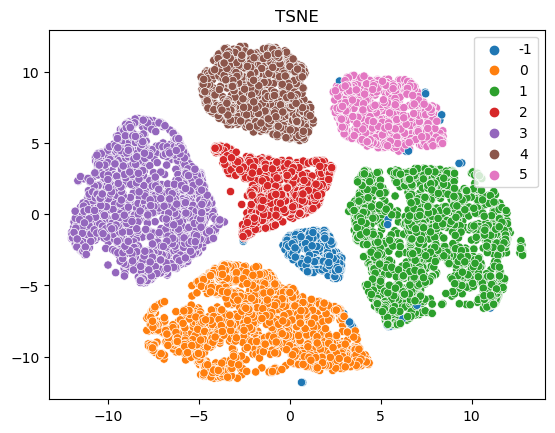

In [75]:
PlotTSNE(copy_df, hue=labels)

11. <a href="#11">Gap-Stat</a>

### Gap-Stat

#### before log

In [76]:
%%capture
!pip install gap-stat

In [77]:
optimalK = OptimalK(parallel_backend='joblib')
n_clusters = optimalK(df_copy, cluster_array=np.arange(2, 21))

print(f'Optimal number of clusters: {n_clusters}')

Optimal number of clusters: 19


#### after log 

In [78]:
optimalK = OptimalK(parallel_backend='joblib')
n_clusters = optimalK(copy_df, cluster_array=np.arange(1, 11))

print(f'Optimal number of clusters: {n_clusters}')

Optimal number of clusters: 10


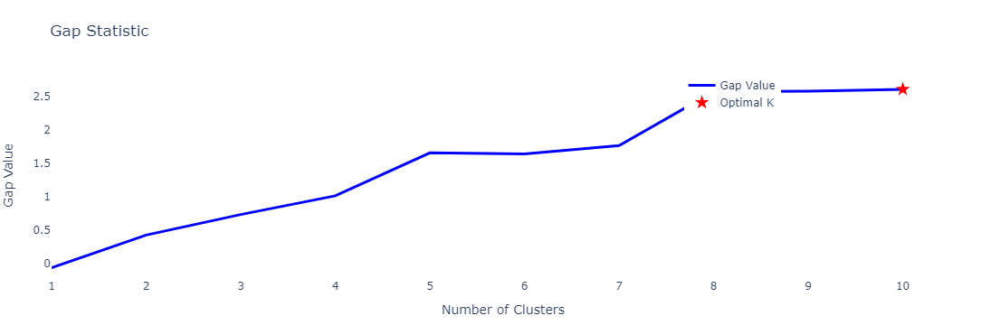

In [79]:
x_values = np.arange(1, 11)
gap_values = optimalK.gap_df.gap_value
optimal_k = n_clusters
gap_trace = go.Scatter(x=x_values, y=gap_values, mode='lines', line=dict(color='blue', width=3), name='Gap Value')
optimal_k_trace = go.Scatter(x=[optimal_k], y=[optimalK.gap_df.loc[optimal_k-1, 'gap_value']], 
                             mode='markers', marker=dict(color='red', size=12, symbol='star'), 
                             name='Optimal K')
layout = go.Layout(title='Gap Statistic', xaxis=dict(title='Number of Clusters', tickvals=np.arange(1, 11)),
                   yaxis=dict(title='Gap Value'), legend=dict(x=0.7, y=1, traceorder='normal', font=dict(size=12)),
                   margin=dict(l=50, r=50, t=80, b=50), showlegend=True, plot_bgcolor='rgba(0,0,0,0)')
fig = go.Figure(data=[gap_trace, optimal_k_trace], layout=layout)
fig.show()

### GaussianMixture

In [80]:
n_clusters = 7
# Initialize the GaussianMixture model
gaussian_model = GaussianMixture(n_components=n_clusters,covariance_type='full')
labels = gaussian_model.fit_predict(copy_df)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.002s...
[t-SNE] Computed neighbors for 8636 samples in 0.450s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.749932
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.884079
[t-SNE] KL divergence after 300 iterations: 2.240254


(array([[ -0.74263746, -10.950578  ],
        [  4.211509  ,   1.5527726 ],
        [ -0.4283604 ,   3.256629  ],
        ...,
        [  0.7266791 , -10.547865  ],
        [  6.074916  ,  -7.6766644 ],
        [  6.7579193 ,   8.339594  ]], dtype=float32),
 array([-0.74263746,  4.211509  , -0.4283604 , ...,  0.7266791 ,
         6.074916  ,  6.7579193 ], dtype=float32),
 array([-10.950578 ,   1.5527726,   3.256629 , ..., -10.547865 ,
         -7.6766644,   8.339594 ], dtype=float32))

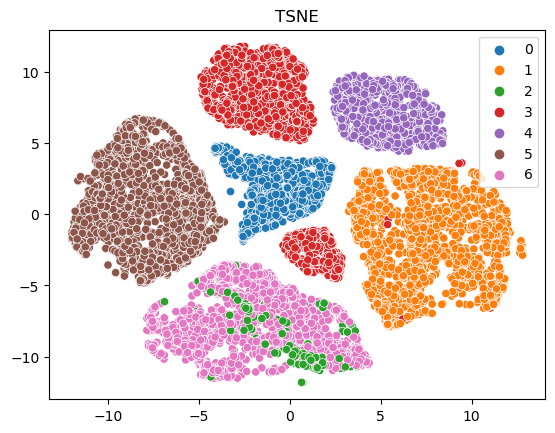

In [81]:
PlotTSNE(copy_df, hue=labels)

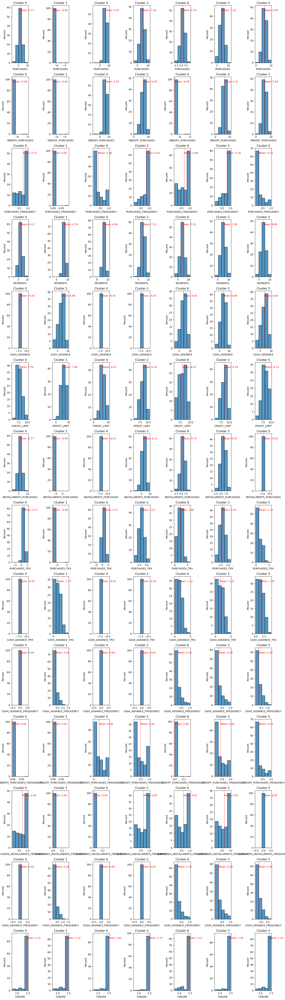

In [82]:
copy_df['Cluster'] = clustering.labels_
cols = ['PURCHASES', 'ONEOFF_PURCHASES', 'PURCHASES_FREQUENCY', 'PAYMENTS', 'CASH_ADVANCE',
        'CREDIT_LIMIT', 'INSTALLMENTS_PURCHASES', 'PURCHASES_TRX', 'CASH_ADVANCE_TRX',
        'CASH_ADVANCE_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
        'CASH_ADVANCE_FREQUENCY', 'TENURE']
clusters = copy_df['Cluster'].unique()
num_rows = len(cols)
num_cols = len(clusters)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows))
for i, col in enumerate(cols):
    for j, cluster in enumerate(clusters):
        data = copy_df[copy_df['Cluster'] == cluster][col]
        sns.histplot(data, bins=5, ax=axes[i, j], stat='percent')
        axes[i, j].set_title(f'Cluster {cluster}')
        axes[i, j].set_xlabel(col)
        axes[i, j].set_ylabel('Percent')
        mean_value = np.mean(data)
        axes[i, j].axvline(mean_value, color='r', linestyle='--', linewidth=1)
        axes[i, j].text(mean_value, axes[i, j].get_ylim()[1] * 0.9, f'Mean: {mean_value:.2f}', color='r')
plt.tight_layout()
plt.show()

In [83]:
copy_df.groupby('Cluster')[cols].sum()

,PURCHASES,ONEOFF_PURCHASES,PURCHASES_FREQUENCY,PAYMENTS,CASH_ADVANCE,CREDIT_LIMIT,INSTALLMENTS_PURCHASES,PURCHASES_TRX,CASH_ADVANCE_TRX,CASH_ADVANCE_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,TENURE
Cluster,,,,,,,,,,,,,,
0,5.770864,-6.903271,0.715350,6.126505,-6.907755,7.763232,5.772756,2.169841,-6.907755,0.000000,0.000147,0.680743,0.000000,2.433272
1,-6.903430,-6.903430,0.000131,6.762391,6.861136,7.993582,-6.897082,-6.886354,1.365151,0.276870,0.000131,0.000127,0.276870,2.418625
2,7.285642,6.479089,0.813530,7.217925,-6.907755,8.387399,6.214944,3.147648,-6.907755,0.000000,0.461805,0.647499,0.000000,2.465354
3,7.099445,6.311953,0.779415,7.482478,6.894954,8.387365,6.032579,3.048751,1.499075,0.292063,0.396667,0.629306,0.292063,2.446084
4,5.969905,5.970081,0.362724,6.460725,-6.907755,8.066216,-6.907755,1.367264,-6.907755,0.000000,0.362062,0.000331,0.000000,2.444795
5,5.646613,5.647319,0.278231,6.994321,6.851338,8.147214,-6.907755,1.188083,1.450186,0.297126,0.278123,0.000000,0.297126,2.417054
6,5.742498,-6.896136,0.655552,7.020154,6.932484,8.065191,5.744091,2.080520,1.315265,0.261845,0.000548,0.608412,0.261845,2.413151


## `Cluster 0`

### Customer Behavior Overview:
 - Customers in Cluster 0 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$5.8, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 2 transactions.
- Around 71\% of customers in this cluster exhibit frequent purchase behavior, indicating a consistent spending pattern.
- The mean amount of total purchases is \$5.77, suggesting that while purchases are frequent, they are moderate in size.

## `Cluster 1`

### Customer Behavior Overview:
 - Customers in Cluster 1 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$6.89, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 6 transactions.
- The mean amount of total purchases is \$6.9, suggesting that while purchases are frequent, they are moderate in size.

## `Cluster 2`

### Customer Behavior Overview:
 - Customers in Cluster 2 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$6.21, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 3 transactions.
- Around 81\% of customers in this cluster exhibit frequent purchase behavior, indicating a consistent spending pattern.
- The mean amount of total purchases is \$7.28, suggesting that while purchases are frequent, they are moderate in size.

## `Cluster 3`

### Customer Behavior Overview:
 - Customers in Cluster 3 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$6.03, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 3 transactions.
- Around 77\% of customers in this cluster exhibit frequent purchase behavior, indicating a consistent spending pattern.
- The mean amount of total purchases is \$7.09, suggesting that while purchases are frequent, they are moderate in size.

## `Cluster 4`

### Customer Behavior Overview:
 - Customers in Cluster 4 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$6.9, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 1 transactions.
- Around 36\% of customers in this cluster exhibit frequent purchase behavior, indicating a consistent spending pattern.
- The mean amount of total purchases is \$5.96, suggesting that while purchases are frequent, they are moderate in size.

## `Cluster 5`

### Customer Behavior Overview:
 - Customers in Cluster 5 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$6.9, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 1 transactions.
- Around 27\% of customers in this cluster exhibit frequent purchase behavior, indicating a consistent spending pattern.
- The mean amount of total purchases is \$5.64, suggesting that while purchases are frequent, they are moderate in size.

## `Cluster 6`

### Customer Behavior Overview:
 - Customers in Cluster 6 demonstrate a preference for making purchases in installments rather than opting for cash advances.
 
### Purchase Behavior:
- The mean amount of purchases made in installments is \$5.77, indicating a significant portion of their spending occurs through installment payments.
- These customers tend to make a high number of purchase transactions, with a mean of approximately 2 transactions.
- Around 65\% of customers in this cluster exhibit frequent purchase behavior, indicating a consistent spending pattern.
- The mean amount of total purchases is \$5.74, suggesting that while purchases are frequent, they are moderate in size.

## There i will use pca kernal to show plot and get know what is better

## PCAKERNAL

In [2]:
# for try 

In [84]:
copy_df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster,Cluster
0,3.711148,0.818182,4.558079,-6.907755,4.558079,-6.907755,0.166667,0.000000,0.083333,0.000000,-6.907755,0.693147,6.907755,5.307287,4.938135,0.000000,2.484907,0,0
1,8.071677,0.909091,-6.907755,-6.907755,-6.907755,8.770741,0.000000,0.000000,0.000000,0.250000,1.386294,-6.907755,8.853665,8.319482,6.977599,0.222222,2.484907,1,1
2,7.822104,1.000000,6.650499,6.650499,-6.907755,-6.907755,1.000000,1.000000,0.000000,0.000000,-6.907755,2.484907,8.922658,6.433047,6.441401,0.000000,2.484907,4,4
3,6.706513,1.000000,2.772589,2.772589,-6.907755,-6.907755,0.083333,0.083333,0.000000,0.000000,-6.907755,0.000000,7.090077,6.519641,5.500406,0.000000,2.484907,4,4
4,7.500988,1.000000,7.195397,-6.907755,7.195397,-6.907755,0.666667,0.000000,0.583333,0.000000,-6.907755,2.079442,7.495542,7.244269,7.786239,0.000000,2.484907,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,1.770146,0.500000,3.039749,3.039749,-6.907755,-6.907755,0.166667,0.166667,0.000000,0.000000,-6.907755,0.000000,6.214608,4.071500,3.772157,0.000000,1.791759,4,4
8632,3.349677,1.000000,5.673736,-6.907755,5.673736,-6.907755,1.000000,0.000000,0.833333,0.000000,-6.907755,1.791759,6.907755,5.785653,3.889499,0.500000,1.791759,0,0
8633,3.152679,0.833333,4.972587,-6.907755,4.972587,-6.907755,0.833333,0.000000,0.666667,0.000000,-6.907755,1.609438,6.907755,4.397786,4.411808,0.250000,1.791759,0,0
8634,2.599541,0.833333,-6.907755,-6.907755,-6.907755,3.598921,0.000000,0.000000,0.000000,0.166667,0.693147,-6.907755,6.214608,3.961764,4.020978,0.250000,1.791759,1,1


In [85]:
dff = copy_df.drop(['cluster', 'Cluster'], axis=1)

In [86]:
transformer = RobustScaler()
robustscaler = transformer.fit_transform(dff[medium_cols +other_cols])
robustscaler

array([[ 0.        , -0.43342624,  0.        , ..., -0.50867914,
        -0.78371624,  0.        ],
       [ 1.        , -3.06315802,  0.        , ...,  0.77795226,
         0.60443625,  1.12472596],
       [ 0.        ,  0.18647999,  0.        , ...,  0.43968239,
         0.65365365,  0.        ],
       ...,
       [ 0.        , -0.1164114 , -0.69314718, ..., -0.84072135,
        -0.78371624,  0.        ],
       [ 0.91642838, -3.06315802, -0.69314718, ..., -1.08728326,
        -1.27818614,  0.7537159 ],
       [ 0.91642838,  0.41156784, -0.69314718, ..., -0.79731345,
        -0.65365365,  0.84306994]])

In [87]:
robustscaler_df = pd.DataFrame(data=robustscaler, columns=transformer.get_feature_names_out())
robustscaler_df.head(3) 

,CASH_ADVANCE_TRX,PURCHASES_TRX,TENURE,PAYMENTS,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,BALANCE,PURCHASES,MINIMUM_PAYMENTS,CREDIT_LIMIT,CASH_ADVANCE
0,0.0,-0.433426,0.0,-0.968854,-0.805394,0.000494,-1.171605,-0.418387,-0.508679,-0.783716,0.000000
1,1.0,-3.063158,0.0,0.987940,-0.805394,-0.875419,0.471206,-3.920148,0.777952,0.604436,1.124726
2,0.0,0.186480,0.0,-0.237533,0.213779,-0.875419,0.377181,0.220656,0.439682,0.653654,0.000000


In [88]:
df_copy = dff.reset_index(drop=True)
df_copy = pd.concat((robustscaler_df, dff[low_cols]), axis=1)
df_copy

,CASH_ADVANCE_TRX,PURCHASES_TRX,TENURE,PAYMENTS,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,BALANCE,PURCHASES,MINIMUM_PAYMENTS,CREDIT_LIMIT,CASH_ADVANCE,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PRC_FULL_PAYMENT
0,0.000000,-0.433426,0.000000,-0.968854,-0.805394,0.000494,-1.171605,-0.418387,-0.508679,-0.783716,0.000000,0.818182,0.166667,0.000000,0.083333,0.000000,0.000000
1,1.000000,-3.063158,0.000000,0.987940,-0.805394,-0.875419,0.471206,-3.920148,0.777952,0.604436,1.124726,0.909091,0.000000,0.000000,0.000000,0.250000,0.222222
2,0.000000,0.186480,0.000000,-0.237533,0.213779,-0.875419,0.377181,0.220656,0.439682,0.653654,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
3,0.000000,-0.673239,0.000000,-0.181280,-0.077723,-0.875419,-0.043114,-0.963690,-0.153961,-0.653654,0.000000,1.000000,0.083333,0.083333,0.000000,0.000000,0.000000
4,0.000000,0.046199,0.000000,0.289456,-0.805394,0.201968,0.256201,0.387072,1.288097,-0.364407,0.000000,1.000000,0.666667,0.000000,0.583333,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,0.000000,-0.673239,-0.693147,-1.771651,-0.057641,-0.875419,-1.902869,-0.882097,-1.244257,-1.278186,0.000000,0.500000,0.166667,0.166667,0.000000,0.000000,0.000000
8632,0.000000,-0.053332,-0.693147,-0.658096,-0.805394,0.085723,-1.307788,-0.077656,-1.170230,-0.783716,0.000000,1.000000,1.000000,0.000000,0.833333,0.000000,0.500000
8633,0.000000,-0.116411,-0.693147,-1.559688,-0.805394,0.032160,-1.382006,-0.291793,-0.840721,-0.783716,0.000000,0.833333,0.833333,0.000000,0.666667,0.000000,0.250000
8634,0.916428,-3.063158,-0.693147,-1.842938,-0.805394,-0.875419,-1.590398,-3.920148,-1.087283,-1.278186,0.753716,0.833333,0.000000,0.000000,0.000000,0.166667,0.250000


In [89]:
copy_dff = dff.copy()
copy_dff = copy_dff.dropna().reset_index(drop=True)
copy_dff.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,3.711148,0.818182,4.558079,-6.907755,4.558079,-6.907755,0.166667,0.000000,0.083333,0.00,-6.907755,0.693147,6.907755,5.307287,4.938135,0.000000,2.484907
1,8.071677,0.909091,-6.907755,-6.907755,-6.907755,8.770741,0.000000,0.000000,0.000000,0.25,1.386294,-6.907755,8.853665,8.319482,6.977599,0.222222,2.484907
2,7.822104,1.000000,6.650499,6.650499,-6.907755,-6.907755,1.000000,1.000000,0.000000,0.00,-6.907755,2.484907,8.922658,6.433047,6.441401,0.000000,2.484907
3,6.706513,1.000000,2.772589,2.772589,-6.907755,-6.907755,0.083333,0.083333,0.000000,0.00,-6.907755,0.000000,7.090077,6.519641,5.500406,0.000000,2.484907
4,7.500988,1.000000,7.195397,-6.907755,7.195397,-6.907755,0.666667,0.000000,0.583333,0.00,-6.907755,2.079442,7.495542,7.244269,7.786239,0.000000,2.484907


In [90]:
for col in copy_dff[other_cols + medium_cols]:
    copy_dff[col] = copy_dff[col].apply(change_zero)

print(copy_dff)

       BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
0     1.311341           0.818182   1.516901               NaN   
1     2.088361           0.909091        NaN               NaN   
2     2.056954           1.000000   1.894692          1.894692   
3     1.903079           1.000000   1.019781          1.019781   
4     2.015035           1.000000   1.973442               NaN   
...        ...                ...        ...               ...   
8631  0.571062           0.500000   1.111775          1.111775   
8632  1.208864           1.000000   1.735848               NaN   
8633  1.148253           0.833333   1.603940               NaN   
8634  0.955335           0.833333        NaN               NaN   
8635  1.778471           0.666667   1.945469          1.945469   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
0                   1.516901           NaN             0.166667   
1                        NaN      2.171421             0.000000   
2     

In [91]:
copy_dff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8636 entries, 0 to 8635
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8597 non-null   float64
 1   BALANCE_FREQUENCY                 8636 non-null   float64
 2   PURCHASES                         6664 non-null   float64
 3   ONEOFF_PURCHASES                  4513 non-null   float64
 4   INSTALLMENTS_PURCHASES            4889 non-null   float64
 5   CASH_ADVANCE                      4205 non-null   float64
 6   PURCHASES_FREQUENCY               8636 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 10  CASH_ADVANCE_TRX                  4205 non-null   float64
 11  PURCHASES_TRX                     6669 non-null   float64
 12  CREDIT

In [92]:
from sklearn.decomposition import KernelPCA
from sklearn.impute import SimpleImputer

### i will use kernal rbf

### RBF

In [93]:
imputer = SimpleImputer(strategy='mean')
copy_dff_imputed = imputer.fit_transform(copy_dff)
kernel_pca = KernelPCA(n_components=15, kernel="rbf", gamma=10, fit_inverse_transform=True, alpha=0.1)
Data_kernel_pca = kernel_pca.fit_transform(copy_dff_imputed)


In [94]:
wsse = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(Data_kernel_pca)
    wss_iter = kmeans.inertia_
    wsse.append(wss_iter)

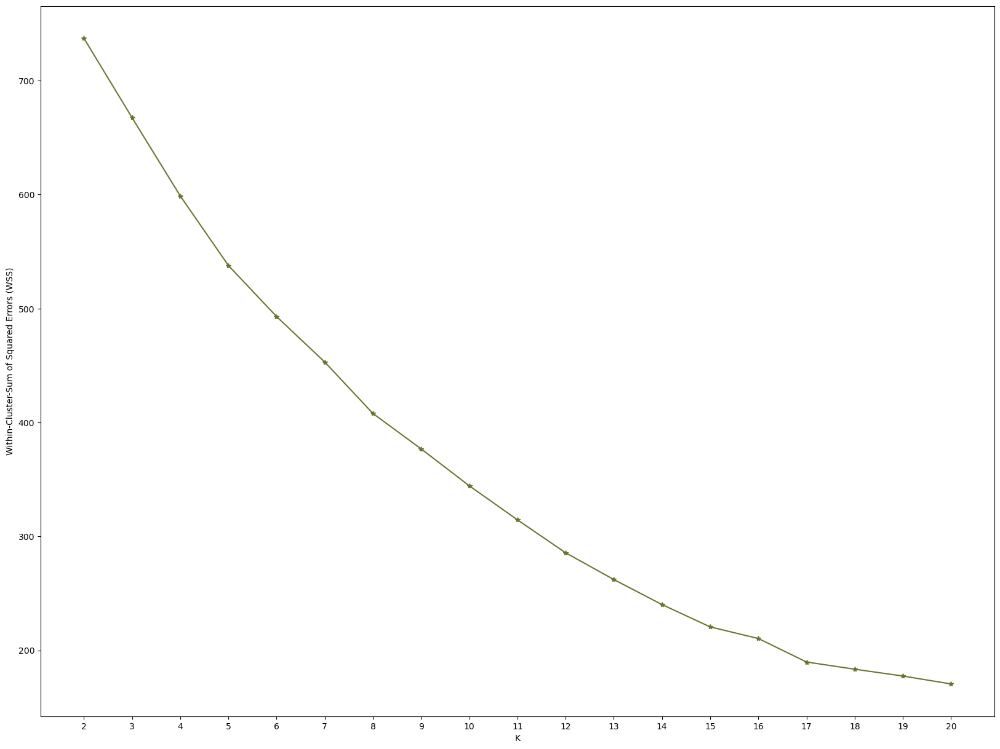

In [95]:
plt.figure(figsize=(20,15))
plt.plot(K,wsse, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [96]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

array([4, 2, 5, ..., 4, 2, 3])

In [101]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.013s...
[t-SNE] Computed neighbors for 8636 samples in 0.322s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.209364
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.886761
[t-SNE] KL divergence after 300 iterations: 1.956650


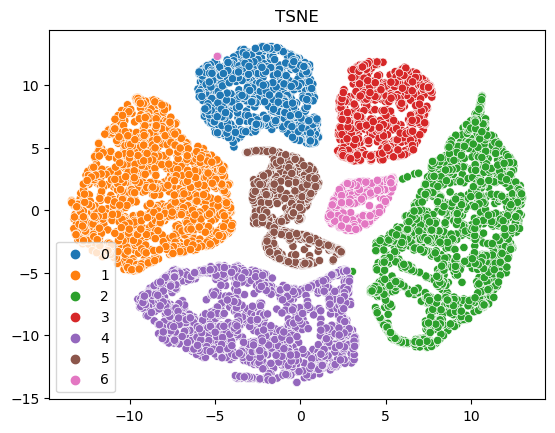

In [102]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");

### Poly

In [103]:
kernel_pca_poly = KernelPCA(n_components=15, kernel="poly", degree=3, fit_inverse_transform=True, alpha=0.1)
Data_kernel_pca_poly = kernel_pca_poly.fit_transform(copy_dff_imputed)

In [104]:
wssew = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(Data_kernel_pca_poly)
    wss_iter = kmeans.inertia_
    wssew.append(wss_iter)

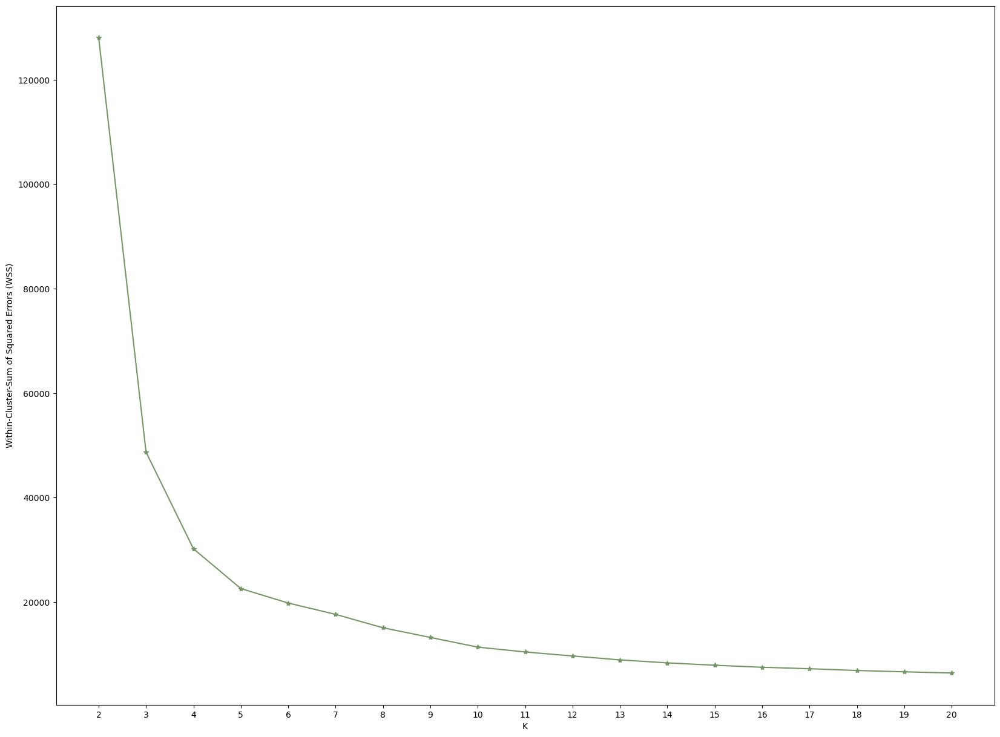

In [105]:
plt.figure(figsize=(20,15))
plt.plot(K,wssew, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [106]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

array([0, 2, 5, ..., 0, 2, 1])

In [107]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.022s...
[t-SNE] Computed neighbors for 8636 samples in 0.267s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.209364
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.886761
[t-SNE] KL divergence after 300 iterations: 1.956650


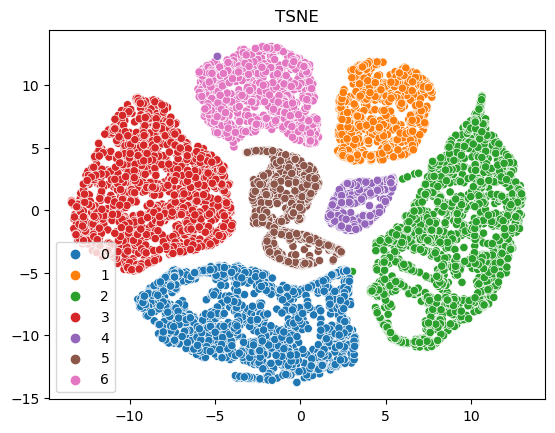

In [108]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");

### Cosine

In [109]:
kernel_pca_cosine = KernelPCA(n_components=15, kernel="cosine", fit_inverse_transform=True, alpha=0.1)
Data_kernel_pca_cosine = kernel_pca_cosine.fit_transform(copy_dff_imputed)

In [110]:
wssew = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(Data_kernel_pca_poly)
    wss_iter = kmeans.inertia_
    wssew.append(wss_iter)

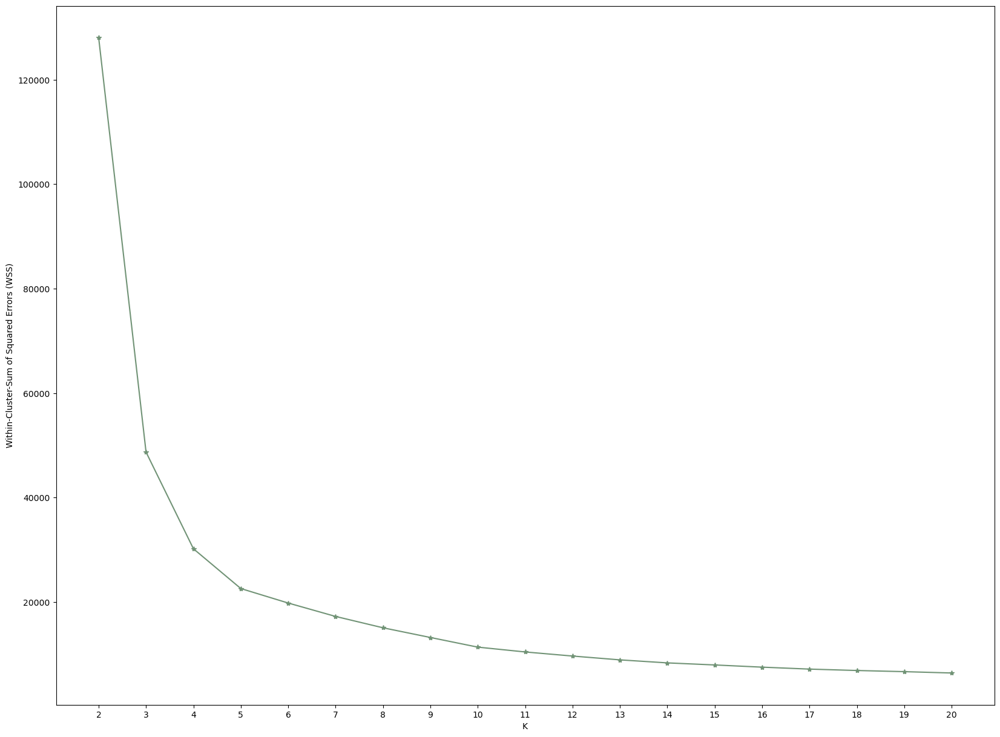

In [111]:
plt.figure(figsize=(20,15))
plt.plot(K,wssew, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [112]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

array([0, 1, 4, ..., 0, 1, 5])

In [113]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.018s...
[t-SNE] Computed neighbors for 8636 samples in 0.270s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.209364
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.886761
[t-SNE] KL divergence after 300 iterations: 1.956650


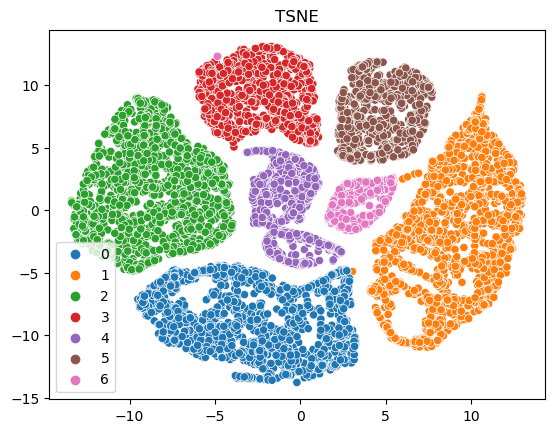

In [114]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");

In [1]:
# kernel_pca_sigmoid = KernelPCA(n_components=15, kernel="sigmoid", gamma=0.1, coef0=1, fit_inverse_transform=True, alpha=0.1)
# Data_kernel_pca_sigmoid = kernel_pca_sigmoid.fit_transform(copy_dff_imputed)

In [ ]:
wssews = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(Data_kernel_pca_poly)
    wss_iter = kmeans.inertia_
    wssews.append(wss_iter)

In [ ]:
plt.figure(figsize=(20,15))
plt.plot(K,wssews, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [ ]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

In [ ]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");

### linear

In [117]:
kernel_pca_linear = KernelPCA(n_components=15, kernel="linear", fit_inverse_transform=True, alpha=0.1)
Data_kernel_pca_linear = kernel_pca_linear.fit_transform(copy_dff_imputed)

In [118]:
wssewsl = []

for k in range(2,21):
    kmeans=KMeans(n_clusters=k)
    kmeans=kmeans.fit(Data_kernel_pca_poly)
    wss_iter = kmeans.inertia_
    wssewsl.append(wss_iter)

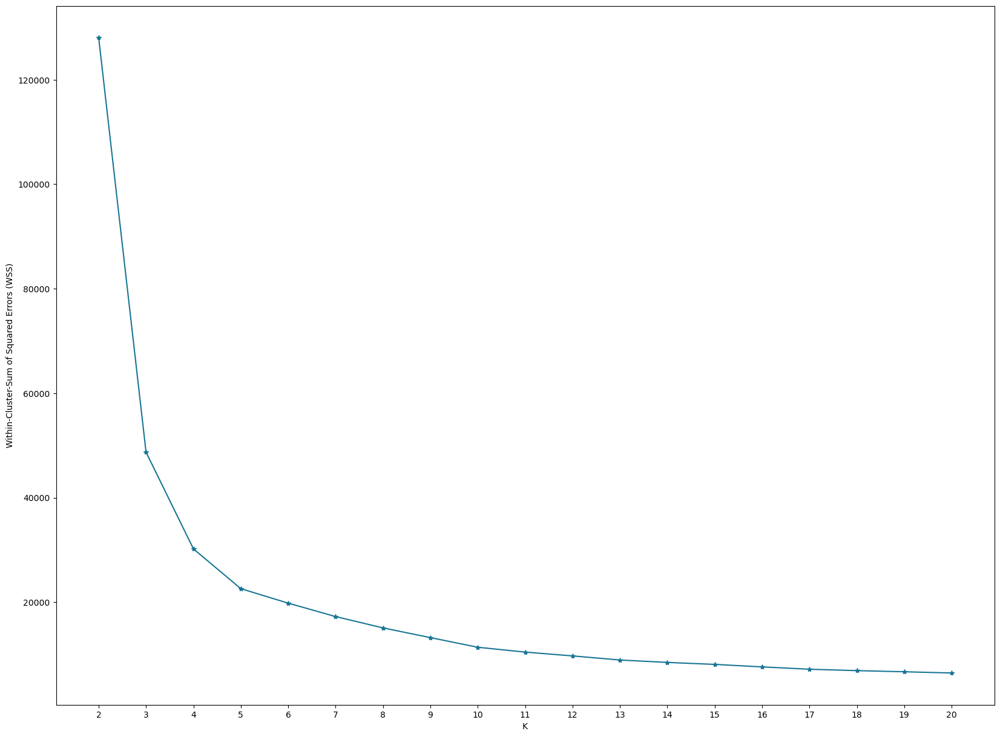

In [121]:
plt.figure(figsize=(20,15))
plt.plot(K,wssewsl, marker = '*', c = pick_random_color())
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.xticks(K);

In [122]:
kmeans = KMeans(n_clusters=7 ,init="k-means++")
kmeans = kmeans.fit(pca_result)

Clusters = kmeans.labels_
Clusters

array([3, 1, 5, ..., 3, 1, 4])

In [123]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)

tsne_2d_one = tsne_results[:,0]
tsne_2d_two = tsne_results[:,1]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8636 samples in 0.016s...
[t-SNE] Computed neighbors for 8636 samples in 0.265s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8636
[t-SNE] Computed conditional probabilities for sample 2000 / 8636
[t-SNE] Computed conditional probabilities for sample 3000 / 8636
[t-SNE] Computed conditional probabilities for sample 4000 / 8636
[t-SNE] Computed conditional probabilities for sample 5000 / 8636
[t-SNE] Computed conditional probabilities for sample 6000 / 8636
[t-SNE] Computed conditional probabilities for sample 7000 / 8636
[t-SNE] Computed conditional probabilities for sample 8000 / 8636
[t-SNE] Computed conditional probabilities for sample 8636 / 8636
[t-SNE] Mean sigma: 0.209364
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.886761
[t-SNE] KL divergence after 300 iterations: 1.956650


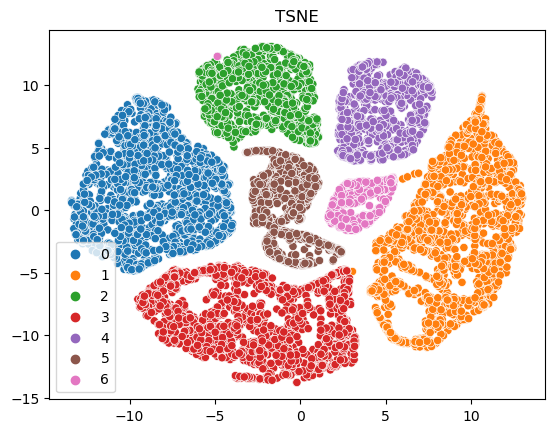

In [124]:
sns.scatterplot(
    x=tsne_2d_one, y=tsne_2d_two,
    hue=Clusters,
    palette="tab10",
    legend="full"
)
plt.title("TSNE");